In [2]:
# colab only
# !pip install tf-nightly

In [118]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

import pathlib
import pydot

In [119]:
# from google.colab import drive
# drive.mount('/content/drive')

In [120]:
DRIVE_FOLDER = "../food201/" # "/content/drive/My Drive/food201"

In [121]:
SUBSET_FOLDER = ""

In [122]:
TRAIN_DATA_FOLDER = pathlib.Path(DRIVE_FOLDER + SUBSET_FOLDER + "/segmented_train")
TEST_DATA_FOLDER = pathlib.Path(DRIVE_FOLDER + SUBSET_FOLDER + "/segmented_test")

TRAIN_MASK_FOLDER = pathlib.Path(DRIVE_FOLDER + SUBSET_FOLDER + "/new_masks_train")
TEST_MASK_FOLDER = pathlib.Path(DRIVE_FOLDER + SUBSET_FOLDER + "/new_masks_test")

## Settings

In [123]:
IMAGE_WIDTH = 128
IMAGE_HEIGHT = 128

In [124]:
CLASSES = 202

## Load data

In [125]:
def load_filenames(data_dir):
    image_count = len(list(data_dir.glob('*/*.jpg')))
    print(f"Prefetched: {image_count} images")
    test_filenames = tf.data.Dataset.list_files(str(data_dir/'*/*'), shuffle=False)
    return image_count, test_filenames.shuffle(image_count, reshuffle_each_iteration=False)

In [126]:
TEST_SIZE, test_data = load_filenames(TEST_DATA_FOLDER)

Prefetched: 2439 images


In [127]:
TRAIN_SIZE, train_data = load_filenames(TRAIN_DATA_FOLDER)


Prefetched: 9654 images


## Create `image, label` tuples

In [128]:
def get_mask(image_path):
    # Produce correct path.
    mask_path = tf.strings.regex_replace(image_path, 'segmented', 'masks')
    mask_file = tf.strings.regex_replace(mask_path, '.jpg', '.png')

    mask = tf.io.read_file(mask_file)
    mask = tf.image.decode_png(mask)
    # Resize using nearest neighbor to avoid introducing non-existent labels.
    return tf.image.resize(mask, [IMAGE_HEIGHT, IMAGE_WIDTH], method='nearest')

In [129]:
def get_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    return tf.image.resize(image, [IMAGE_HEIGHT, IMAGE_WIDTH])  # Necessary for meaningful batching.

In [130]:
def prepare_example(image_path):
    image = get_image(image_path)
    mask = get_mask(image_path)
    return image, mask

In [131]:
# Process datasets.
train_data = train_data.map(prepare_example, num_parallel_calls=tf.data.experimental.AUTOTUNE, deterministic=False)
test_data = test_data.map(prepare_example, num_parallel_calls=tf.data.experimental.AUTOTUNE, deterministic=False)

## Create validation split

In [132]:
VAL_RATIO = 0.75

In [133]:
train_indices = np.random.choice(range(TRAIN_SIZE), int(VAL_RATIO * TRAIN_SIZE), replace=False)
print(f"Train size: {train_indices.shape[0]}")

Train size: 7240


In [134]:
val_indices = list(set(range(TRAIN_SIZE)) - set(train_indices))
print(f"Validation size: {len(val_indices)}")

Validation size: 2414


In [135]:
def subset_dataset(dataset, indices):
    return dataset.enumerate().filter(lambda i, t: tf.reduce_any(i == indices)).map(lambda j, u: u)

In [136]:
train_data = subset_dataset(train_data, train_indices)
val_data = subset_dataset(train_data, val_indices)

## Batching and caching

In [137]:
SHUFFLE_BUFFER = 100
BATCH_SIZE = 16

In [138]:
def cache_oneoff_tasks(dataset):
  dataset = dataset.cache()
  dataset = dataset.shuffle(buffer_size=SHUFFLE_BUFFER)
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

def cache_oneoff_tasks(dataset):
  dataset = dataset.cache()
  dataset = dataset.shuffle(buffer_size=SHUFFLE_BUFFER)
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

train_data = cache_oneoff_tasks(train_data)
val_data = cache_oneoff_tasks(val_data) # Shuffle too, so we see difference pictures in callback

## Image augmentations

In [139]:
# TODO: Flips, HSV, ...

## Vizualization callback

In [23]:
# Visualization callback to see how mask prediction progresses.
class MaskCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        plot_mask_predictions(val_data, 3)

def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [24]:
def plot_mask_predictions(dataset, examples=3):
    plt.figure(figsize=(21, 7 * examples))

    for i, (image, mask) in enumerate(dataset.take(examples)):
        ax = plt.subplot(examples, 3, 3*i+1)
        plt.imshow(image[0].numpy().astype("uint8"))
        plt.axis("off")

        ax = plt.subplot(examples, 3, 3*i+2)
        plt.imshow(mask[0].numpy().astype("uint8").squeeze(axis=2), cmap='gray', vmin=0, vmax=tf.math.reduce_max(mask[0]))
        plt.axis("off")


        pred_mask = create_mask(model.predict(image))

        ax = plt.subplot(examples, 3, 3*i+3)
        plt.imshow(pred_mask.numpy().astype("uint8").squeeze(axis=2), cmap='gray', vmin=0, vmax=tf.math.reduce_max(pred_mask))
        plt.axis("off")

    plt.show()

## Load MobileNet v3

In [25]:
# IMPORTANT: Run this just once per Jupyter kernel start since new loads increase layer numbers.
mobile_net = tf.keras.applications.MobileNetV3Large(
    input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3), alpha=1.0, minimalistic=False, include_top=False,
    weights='imagenet', input_tensor=None, pooling=None,
    dropout_rate=0.2
)

In [26]:
# U-net encoder skips.
encoder_layers = [
    're_lu_2',   # \2^1
    're_lu_6',   # \2^2
    'multiply_1',   # \2^3
    'multiply_13',  # \2^4
    'Conv_1',      # \2^5 (7x7 for 224x224)
]

encoder = [mobile_net.get_layer(l).output for l in encoder_layers]
encoder = tf.keras.Model(inputs=mobile_net.input, outputs=encoder)

In [27]:
# Don't train 'imagenet' weights.
encoder.trainable = False

## Segmentation head

In [28]:
# U-net decoder.
def upsampling_layer(inputs, filters, kernel=(3,3), strides=(2,2), padding='same', dropout=None):
    """
    General Conv2DTranspose -> BN -> (Dropout) -> ReLU layer.
    """
    x = tf.keras.layers.Conv2DTranspose(filters, kernel, strides=strides, padding=padding, use_bias=False)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    
    if dropout is not None:
        x = tf.keras.layers.Dropout(rate=dropout)(x)
    x = tf.keras.layers.ReLU()(x)
    return x

In [29]:
decoder_filters = [512, 256, 128, 64, 32]  # Number of filters as we progress down the decoder.

In [30]:
inputs = tf.keras.layers.Input(shape=[IMAGE_HEIGHT, IMAGE_WIDTH, 3])

# Encoding.
# Set `training` to false to keep BN in inference mode for fine tuning.
encoder_outputs = encoder(inputs, training=False)

# Last model layer output.
x = encoder_outputs[-1]
# Reverse since we go from smallest to largest.
encoder_outputs = reversed(encoder_outputs[:-1])

# Forming U-net.
for encoder_output, filters in zip(encoder_outputs, decoder_filters):
    decoder_output = upsampling_layer(x, filters)
    x = tf.keras.layers.Concatenate()([decoder_output, encoder_output]) # Skip connection.
    

# Get mask prediction back to original size.
outputs = tf.keras.layers.Conv2DTranspose(CLASSES, 3, strides=2, padding='same', activation=tf.nn.softmax)(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

In [31]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

## Model training

In [32]:
EPOCHS = 10

In [34]:
# ============================
# !!!!!! SET NEW RUN ID !!!!!!
# ============================
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath="checkpoints/run_01/cp-{epoch:04d}.ckpt", 
    verbose=1, 
    save_weights_only=True)

Epoch 1/10
453/453 [==============================] - 1475s 3s/step - loss: 3.0195 - accuracy: 0.9068 - val_loss: 2.4988 - val_accuracy: 0.8599
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


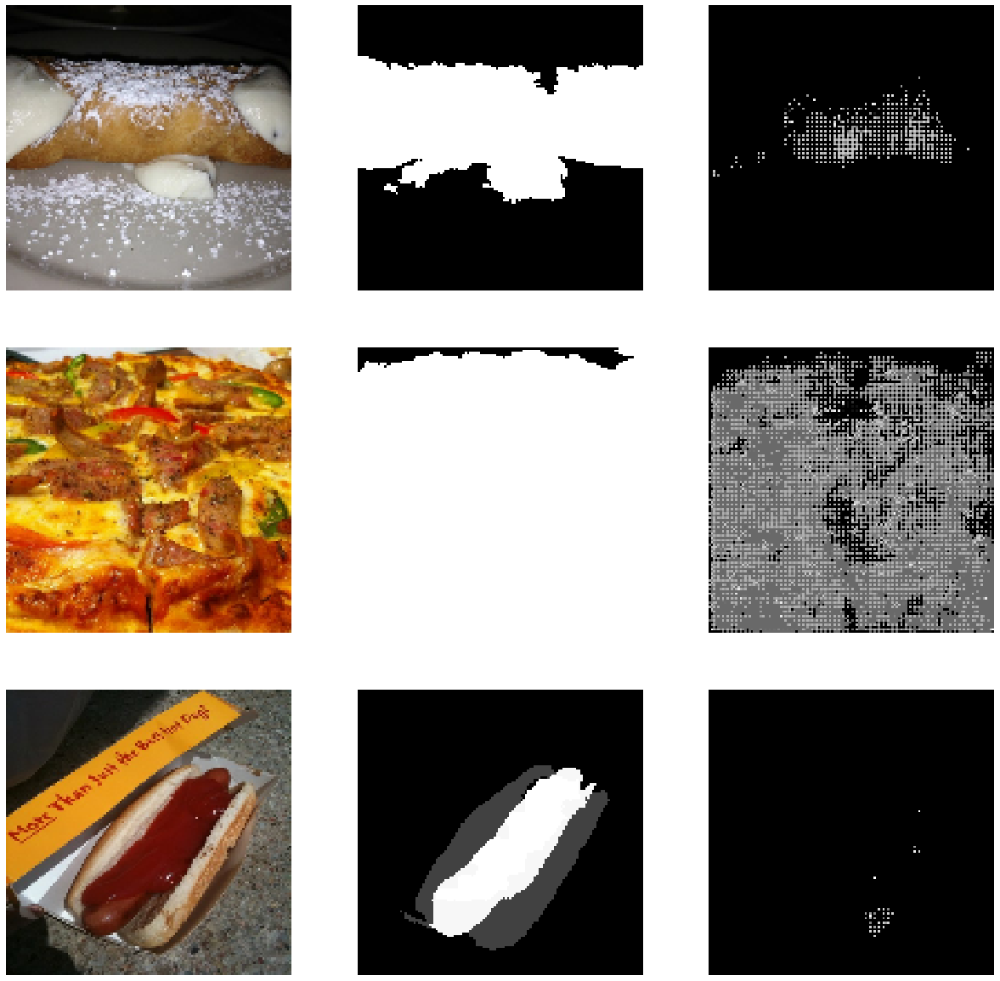


Epoch 00001: saving model to checkpoints/run_01\cp-0001.ckpt
Epoch 2/10
453/453 [==============================] - 1836s 4s/step - loss: 2.4836 - accuracy: 0.9176 - val_loss: 2.2719 - val_accuracy: 0.8420
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


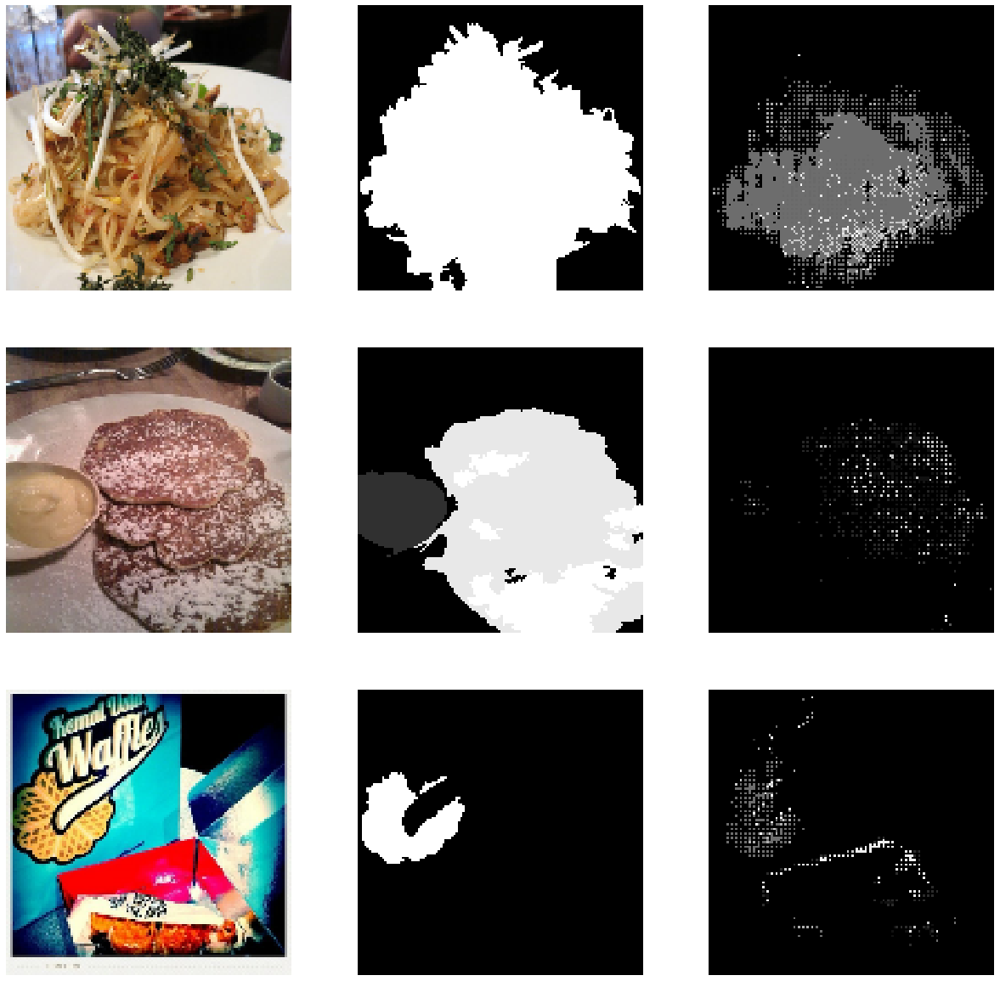


Epoch 00002: saving model to checkpoints/run_01\cp-0002.ckpt
Epoch 3/10
453/453 [==============================] - 1849s 4s/step - loss: 2.2926 - accuracy: 0.8549 - val_loss: 2.0699 - val_accuracy: 0.8305
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


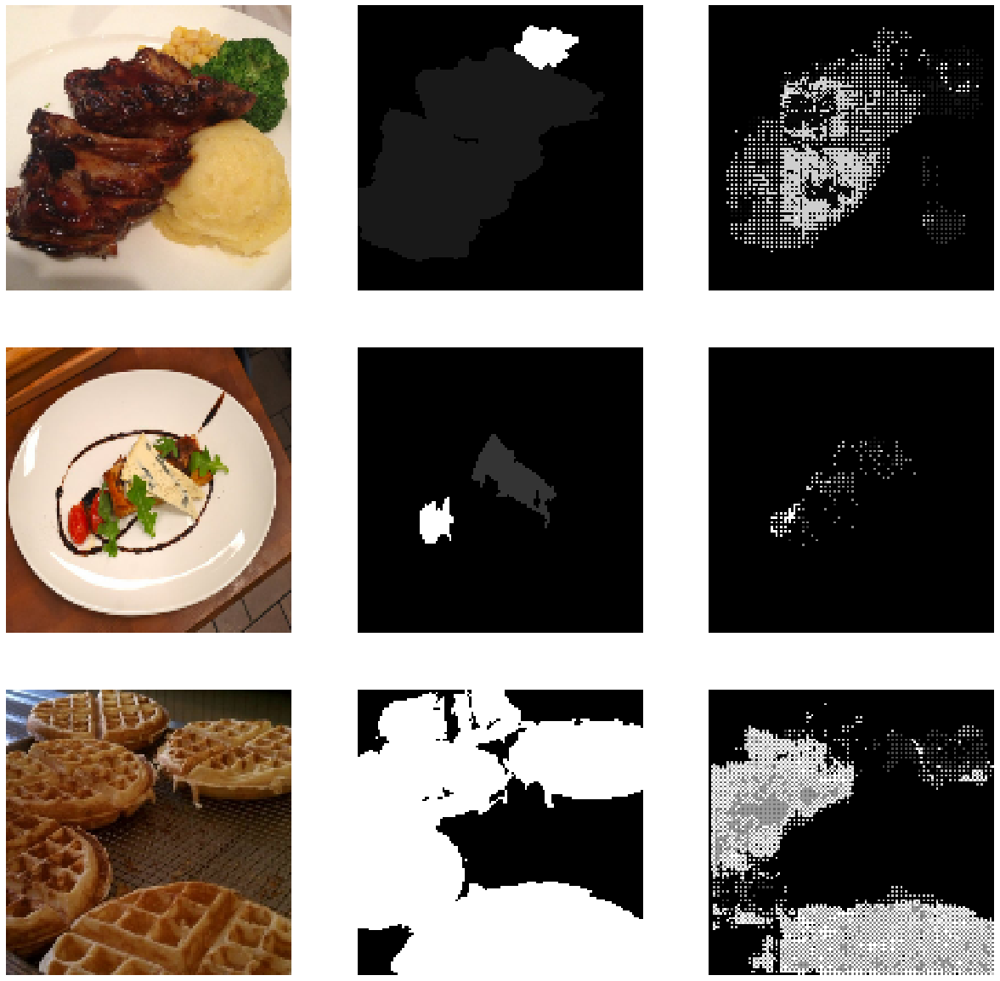


Epoch 00003: saving model to checkpoints/run_01\cp-0003.ckpt
Epoch 4/10
453/453 [==============================] - 978s 2s/step - loss: 2.1231 - accuracy: 0.8038 - val_loss: 1.9351 - val_accuracy: 0.8392
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


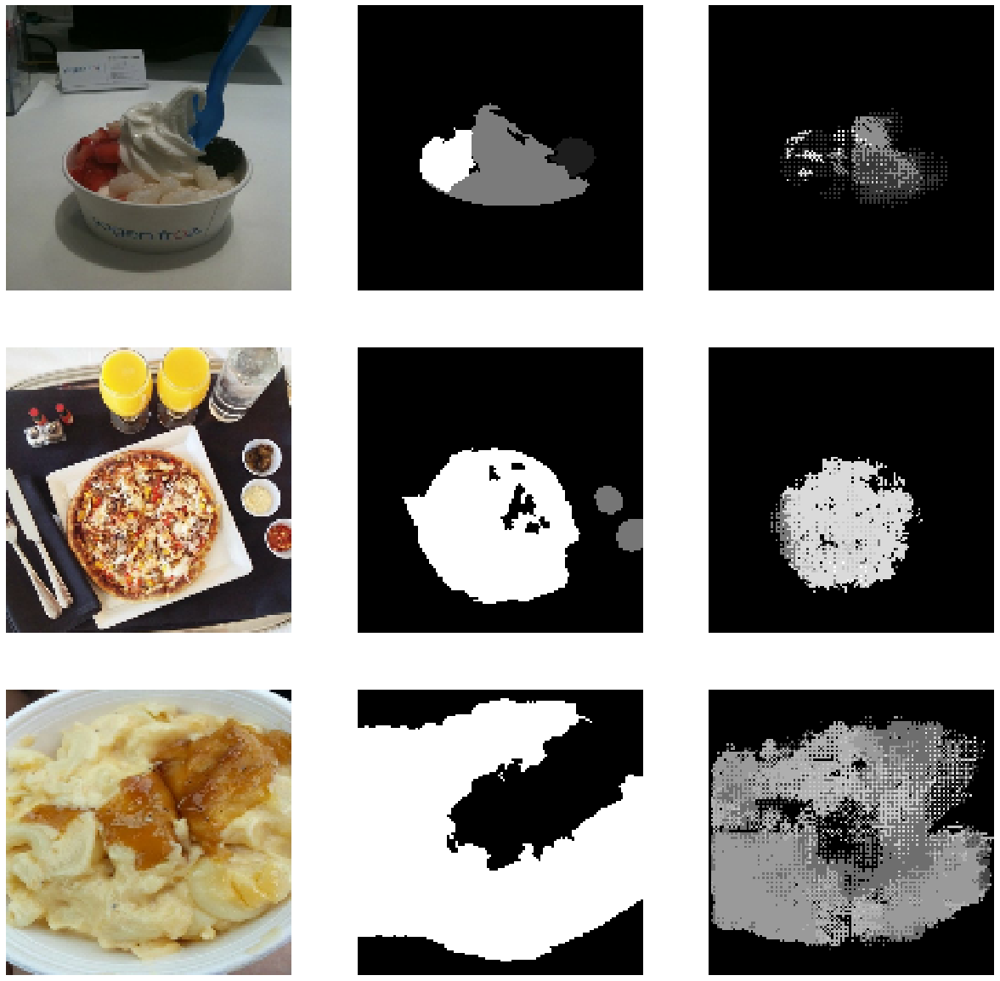


Epoch 00004: saving model to checkpoints/run_01\cp-0004.ckpt
Epoch 5/10
453/453 [==============================] - 998s 2s/step - loss: 2.0204 - accuracy: 0.7815 - val_loss: 1.8214 - val_accuracy: 0.7539
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


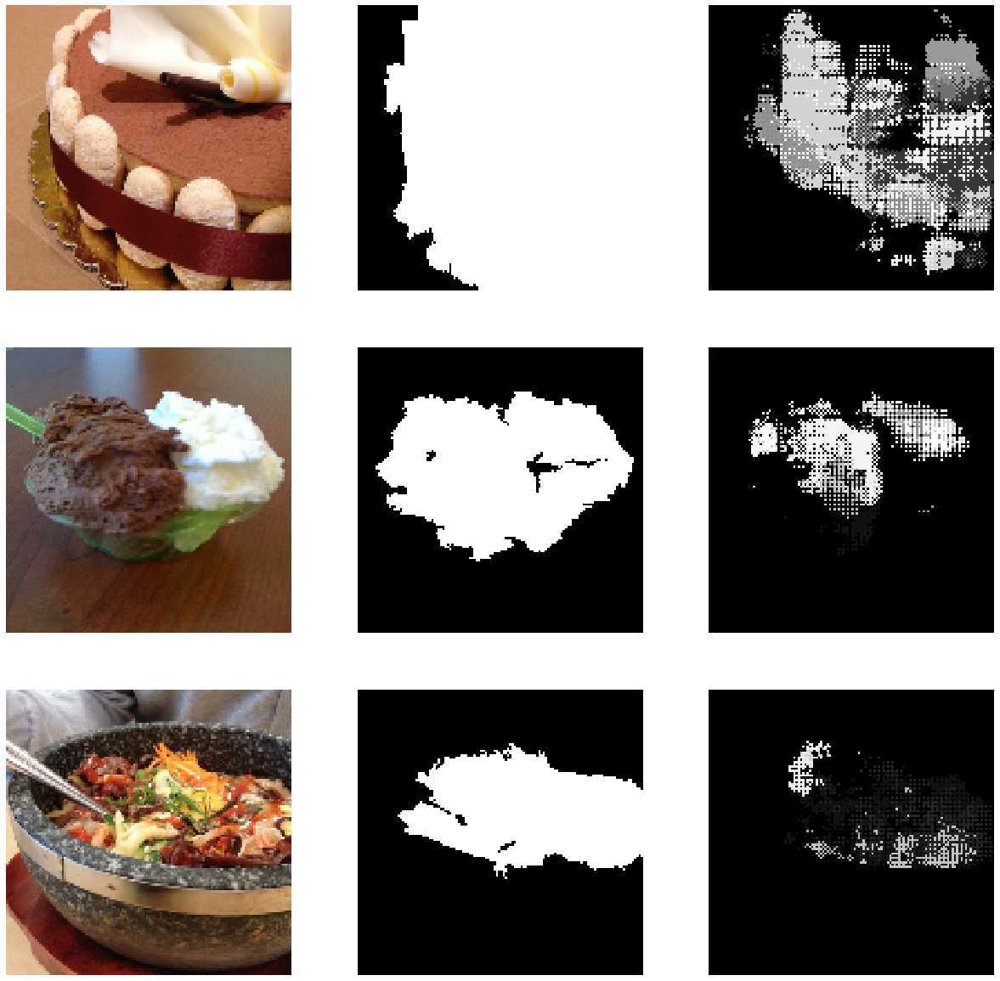


Epoch 00005: saving model to checkpoints/run_01\cp-0005.ckpt
Epoch 6/10
453/453 [==============================] - 1014s 2s/step - loss: 1.9228 - accuracy: 0.7543 - val_loss: 1.7352 - val_accuracy: 0.7540
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


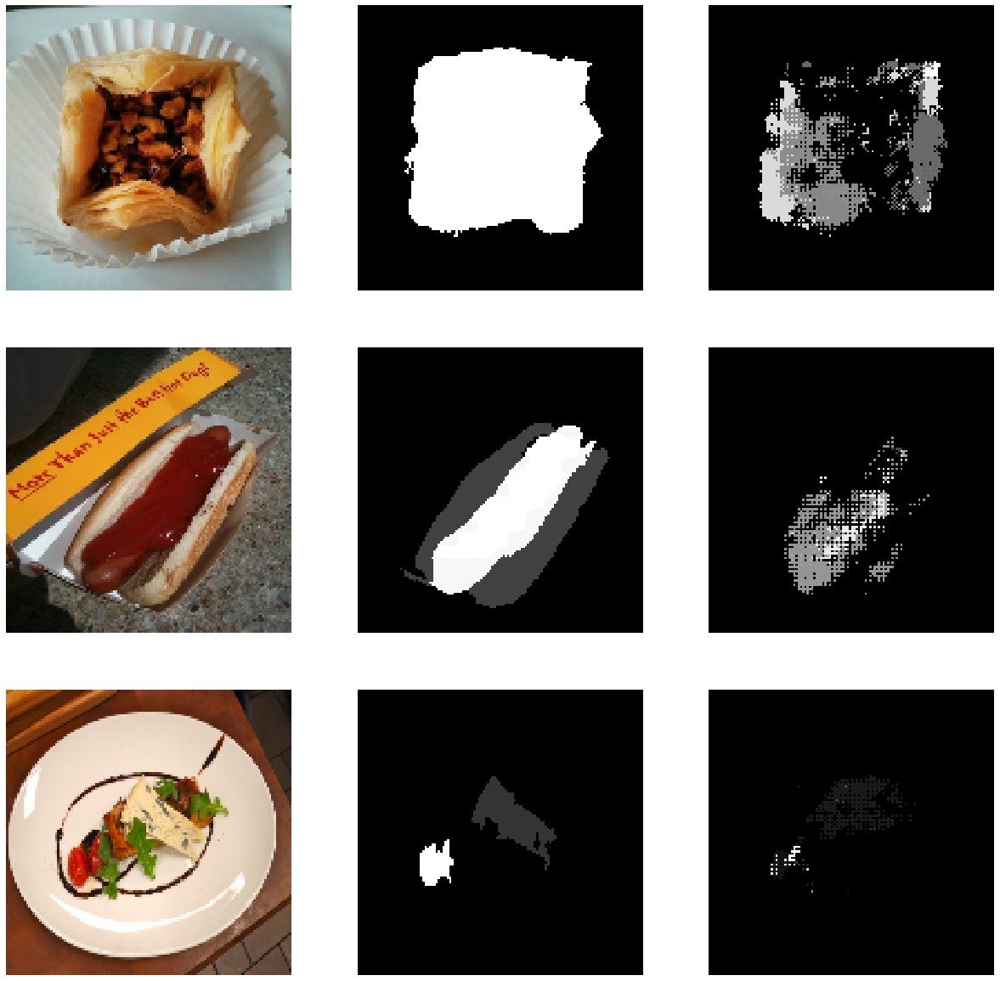


Epoch 00006: saving model to checkpoints/run_01\cp-0006.ckpt
Epoch 7/10
453/453 [==============================] - 1009s 2s/step - loss: 1.8232 - accuracy: 0.7449 - val_loss: 1.6720 - val_accuracy: 0.7587
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


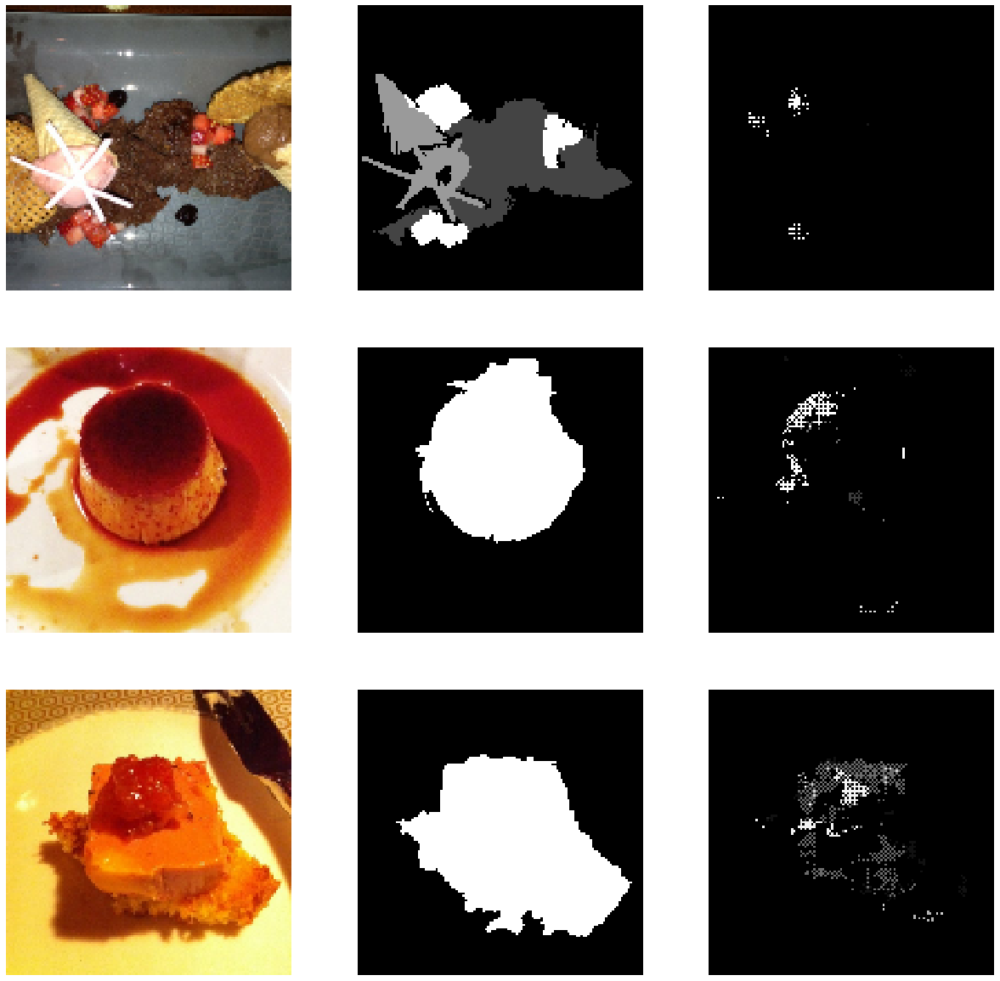


Epoch 00007: saving model to checkpoints/run_01\cp-0007.ckpt
Epoch 8/10
453/453 [==============================] - 990s 2s/step - loss: 1.7529 - accuracy: 0.7291 - val_loss: 1.5957 - val_accuracy: 0.6994
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


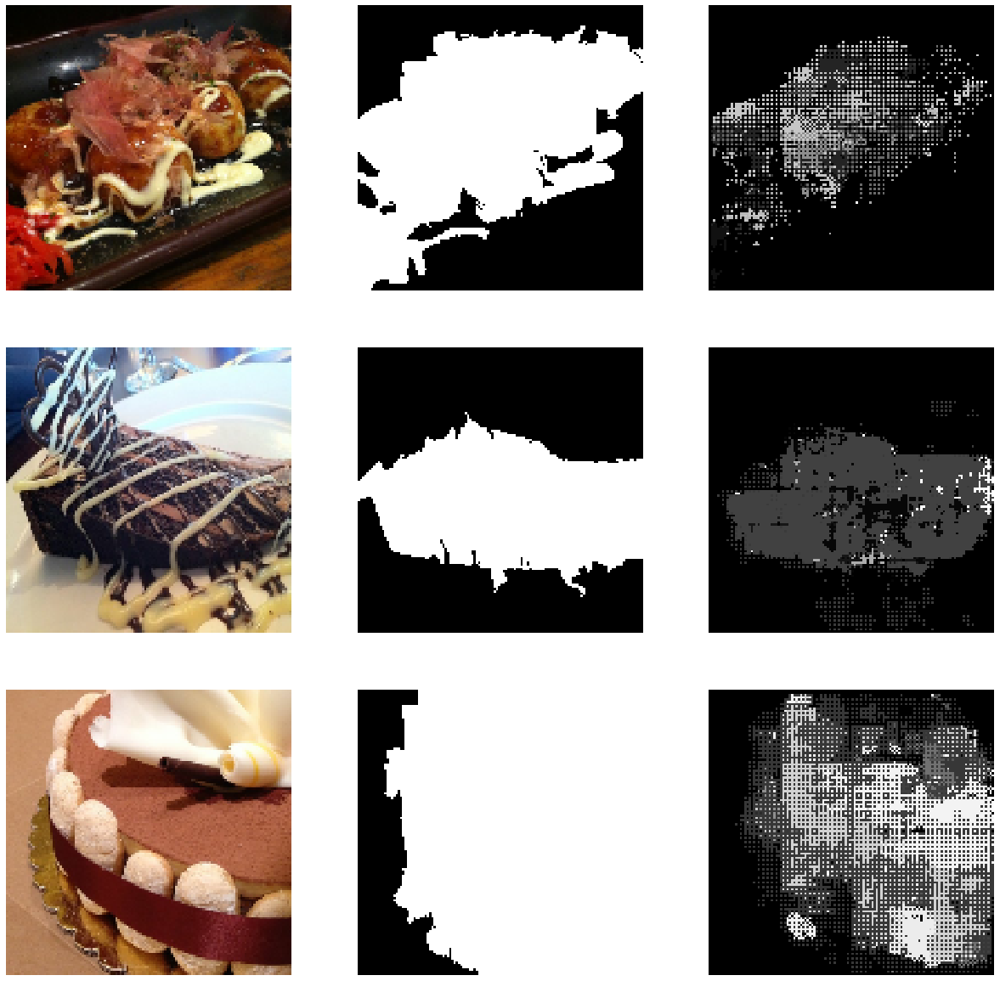


Epoch 00008: saving model to checkpoints/run_01\cp-0008.ckpt
Epoch 9/10
453/453 [==============================] - 994s 2s/step - loss: 1.6761 - accuracy: 0.7134 - val_loss: 1.5235 - val_accuracy: 0.6676
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


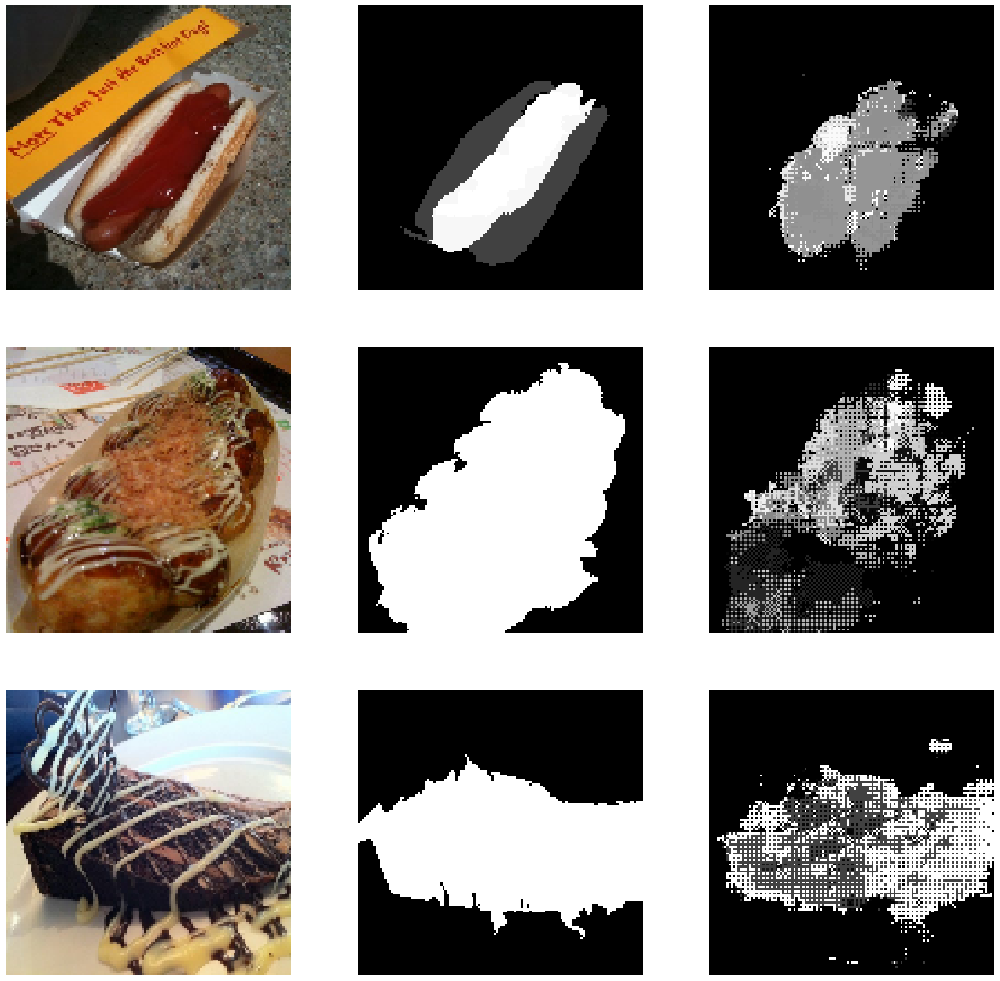


Epoch 00009: saving model to checkpoints/run_01\cp-0009.ckpt
Epoch 10/10
453/453 [==============================] - 990s 2s/step - loss: 1.5992 - accuracy: 0.6998 - val_loss: 1.4607 - val_accuracy: 0.6701
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


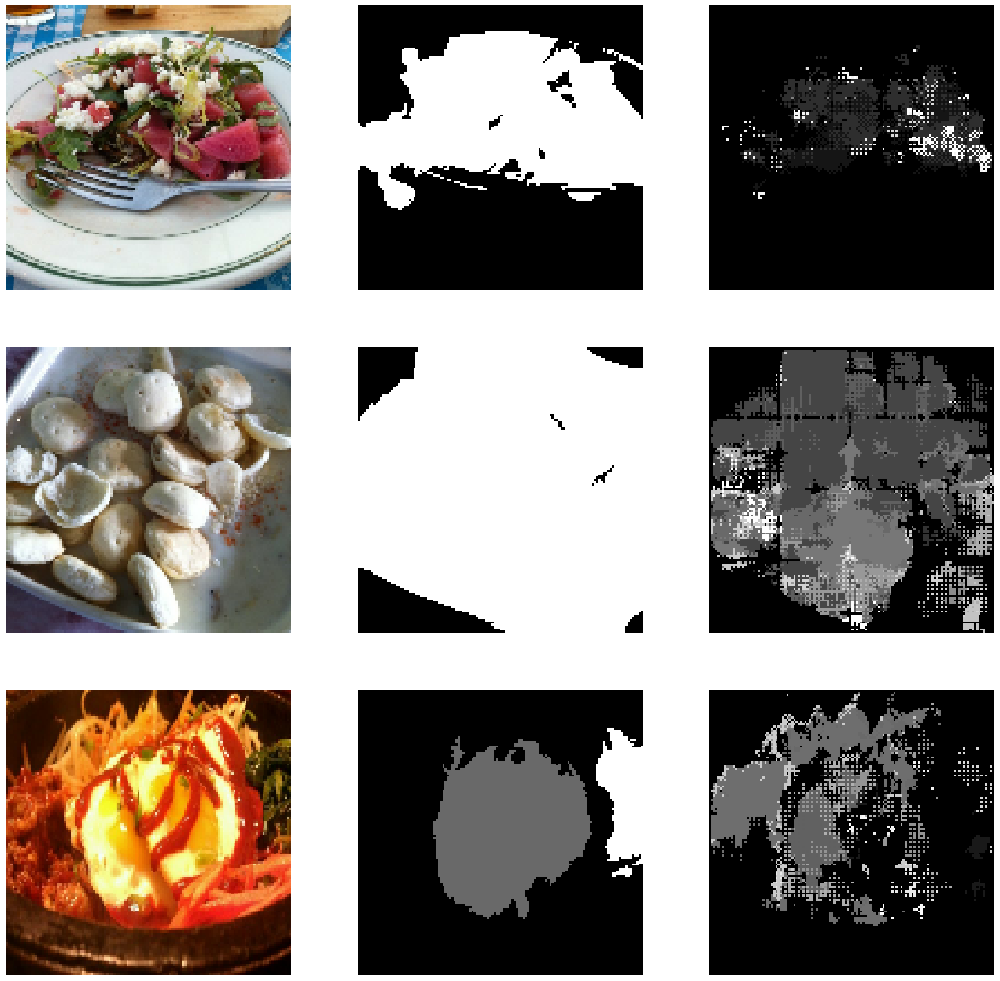


Epoch 00010: saving model to checkpoints/run_01\cp-0010.ckpt


In [87]:
model_history = model.fit(
    train_data, 
    epochs=EPOCHS, 
    validation_data=val_data, 
    callbacks=[MaskCallback(), cp_callback]
)

In [88]:
cp_fine_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath="checkpoints/run_02/cp-{epoch:04d}.ckpt", 
    verbose=1, 
    save_weights_only=True)

Epoch 10/30
453/453 [==============================] - 941s 2s/step - loss: 1.5037 - accuracy: 0.6857 - val_loss: 1.3488 - val_accuracy: 0.6619
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


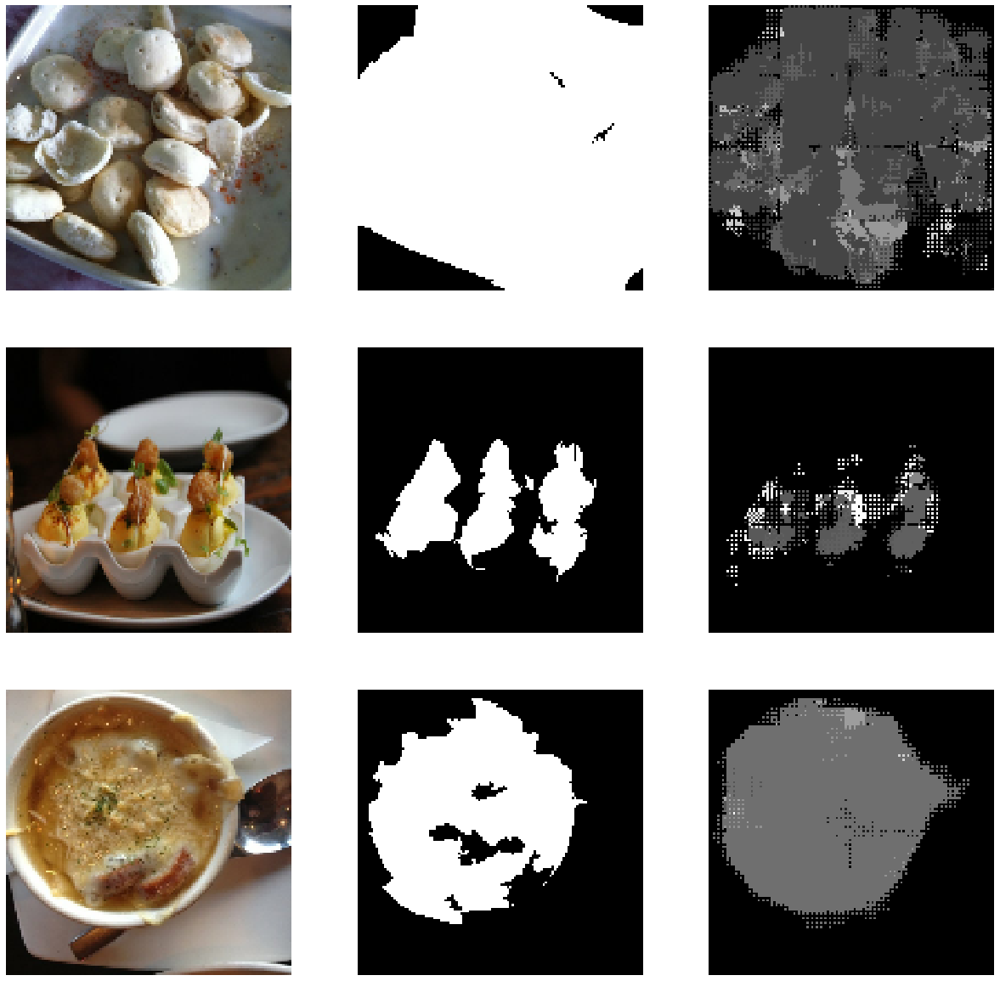


Epoch 00010: saving model to checkpoints/run_02\cp-0010.ckpt
Epoch 11/30
453/453 [==============================] - 951s 2s/step - loss: 1.4319 - accuracy: 0.6758 - val_loss: 1.3138 - val_accuracy: 0.6496
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


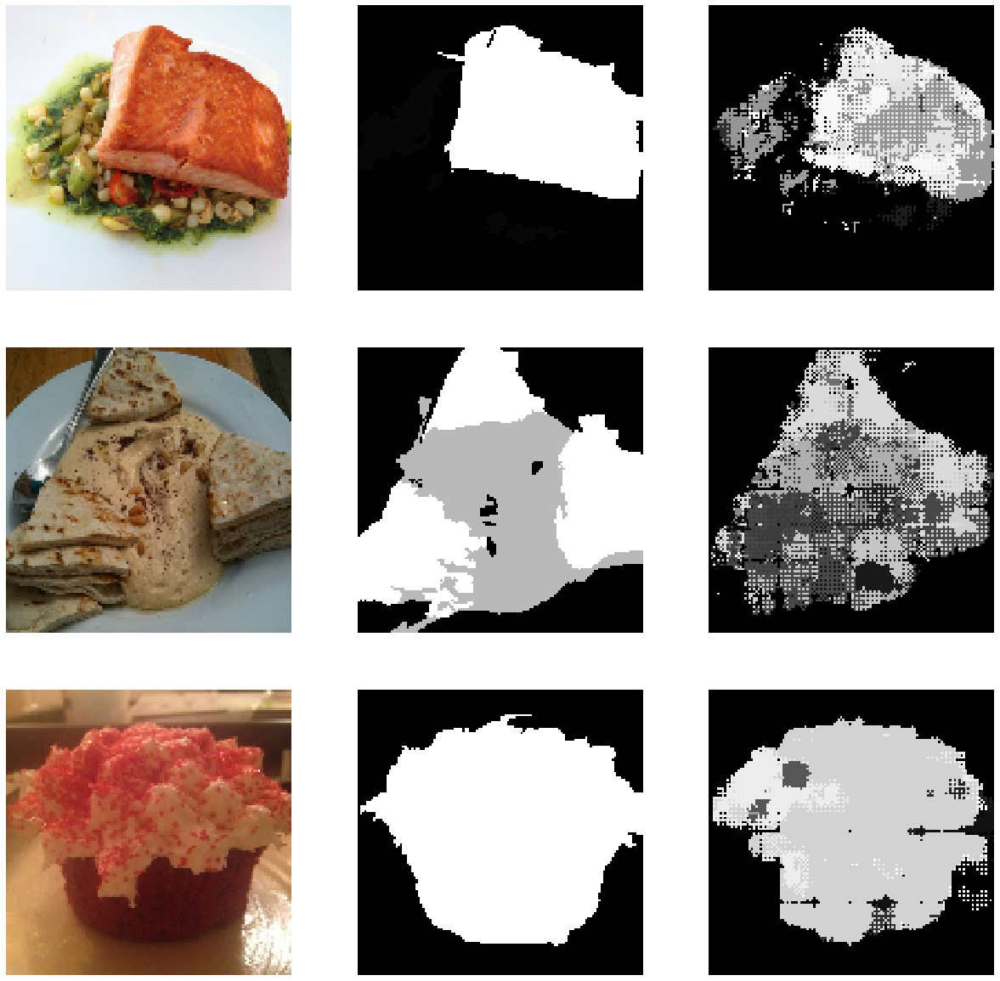


Epoch 00011: saving model to checkpoints/run_02\cp-0011.ckpt
Epoch 12/30
453/453 [==============================] - 962s 2s/step - loss: 1.3592 - accuracy: 0.6673 - val_loss: 1.2719 - val_accuracy: 0.6526
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


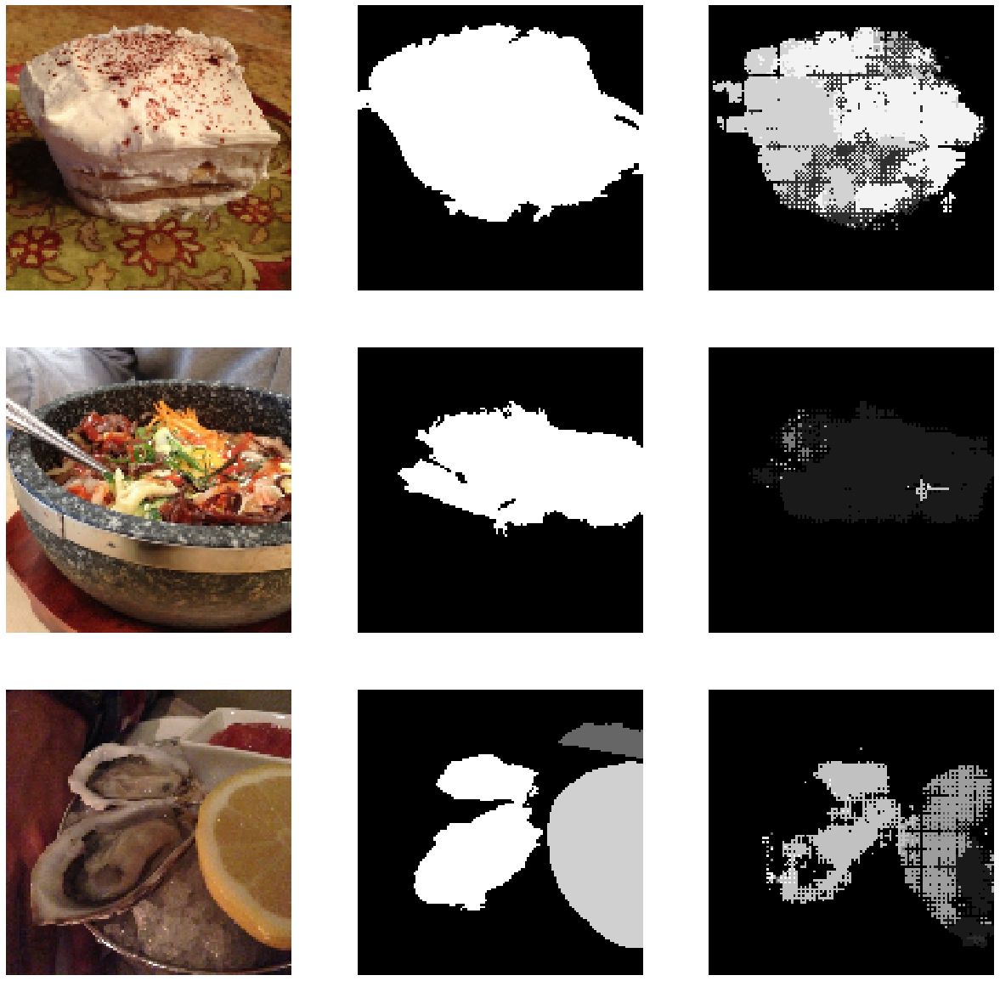


Epoch 00012: saving model to checkpoints/run_02\cp-0012.ckpt
Epoch 13/30
453/453 [==============================] - 965s 2s/step - loss: 1.2924 - accuracy: 0.6603 - val_loss: 1.1944 - val_accuracy: 0.6582
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


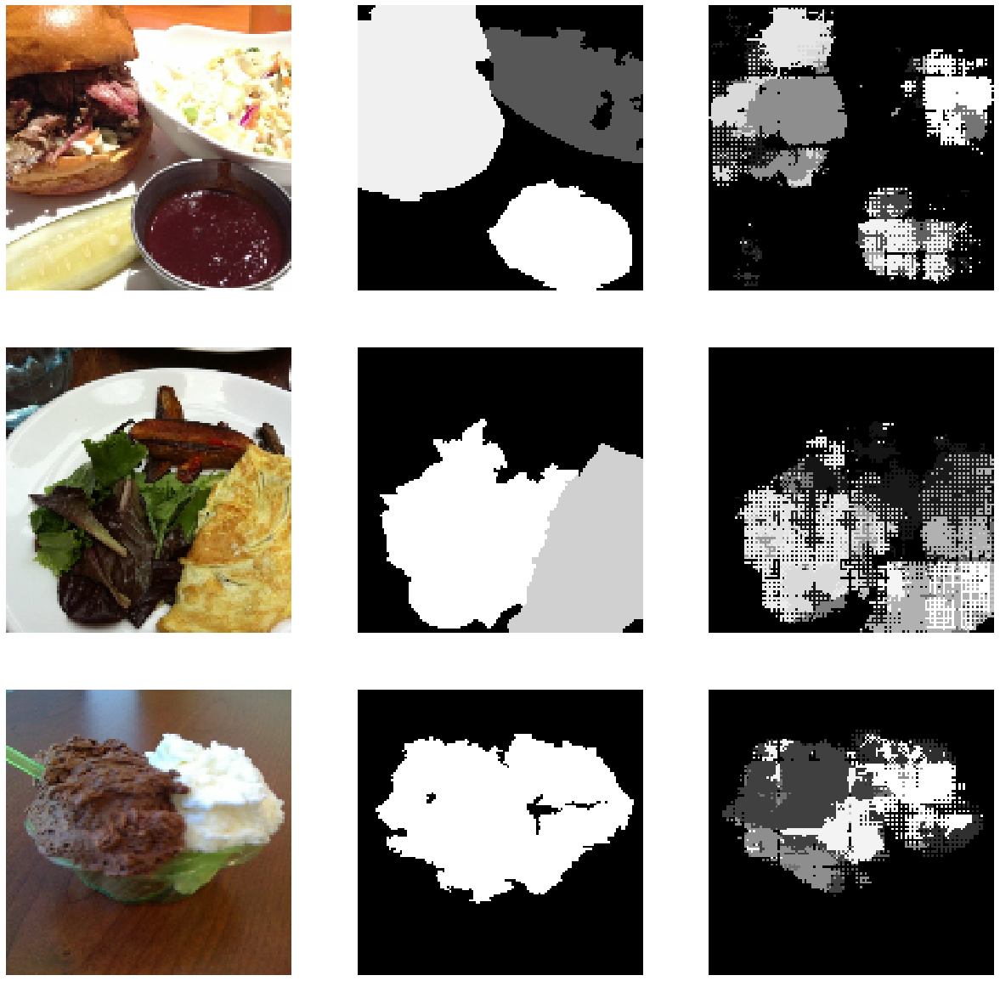


Epoch 00013: saving model to checkpoints/run_02\cp-0013.ckpt
Epoch 14/30
453/453 [==============================] - 964s 2s/step - loss: 1.2203 - accuracy: 0.6523 - val_loss: 1.1413 - val_accuracy: 0.6439
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


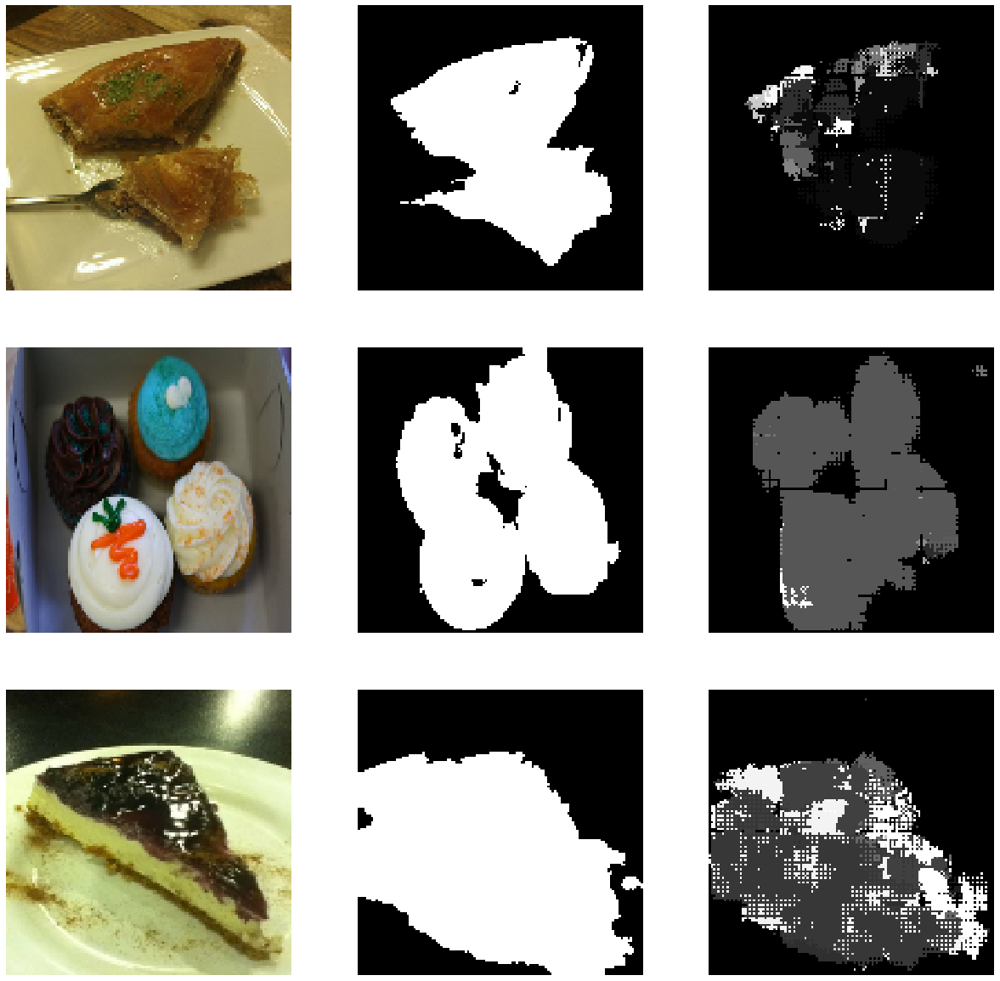


Epoch 00014: saving model to checkpoints/run_02\cp-0014.ckpt
Epoch 15/30
453/453 [==============================] - 976s 2s/step - loss: 1.1634 - accuracy: 0.6465 - val_loss: 1.1252 - val_accuracy: 0.6104
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


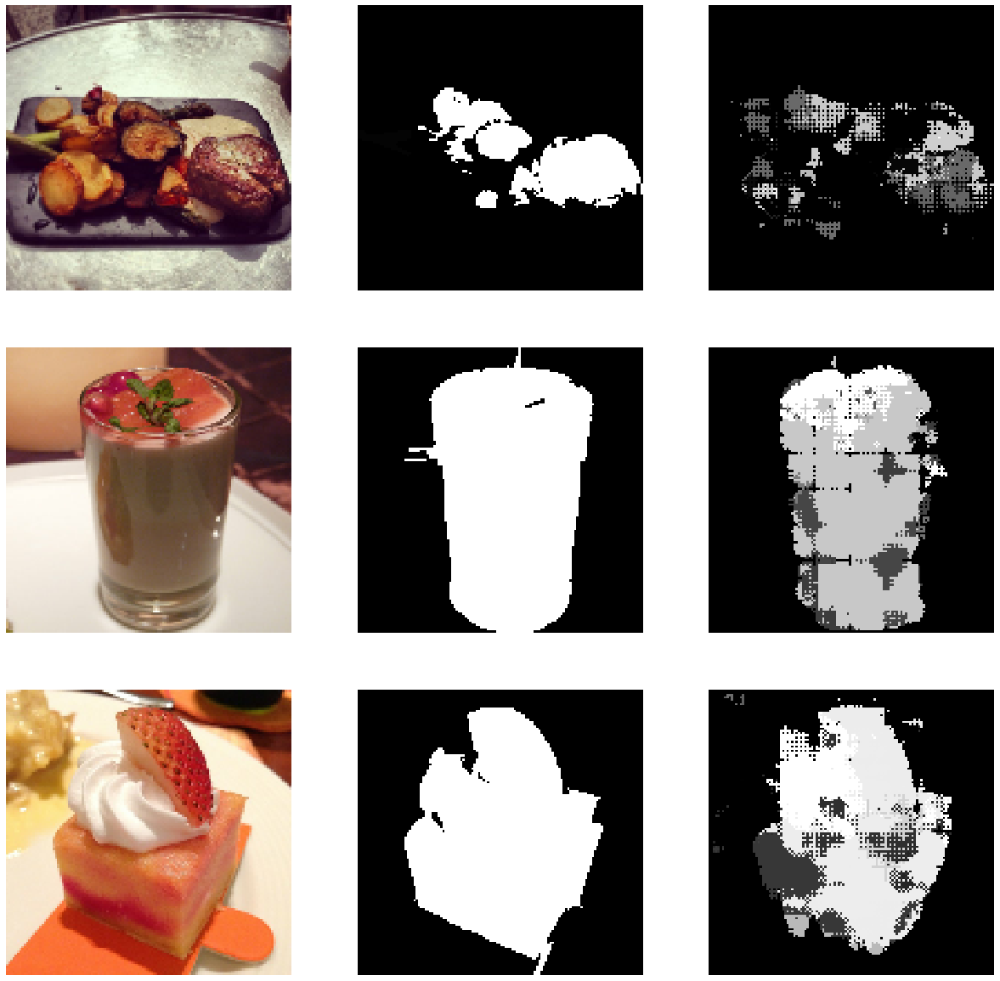


Epoch 00015: saving model to checkpoints/run_02\cp-0015.ckpt
Epoch 16/30
453/453 [==============================] - 973s 2s/step - loss: 1.1012 - accuracy: 0.6409 - val_loss: 1.0742 - val_accuracy: 0.7098
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


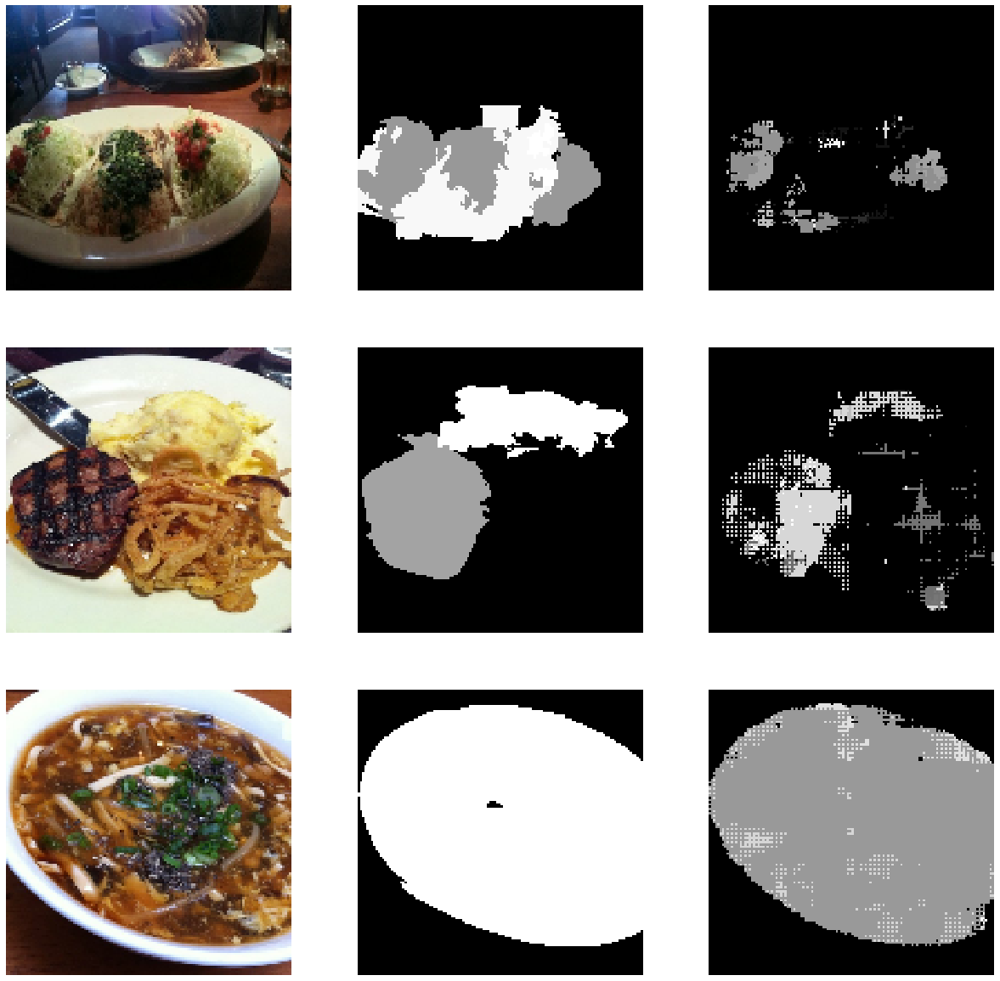


Epoch 00016: saving model to checkpoints/run_02\cp-0016.ckpt
Epoch 17/30
453/453 [==============================] - 981s 2s/step - loss: 1.0517 - accuracy: 0.6366 - val_loss: 1.0268 - val_accuracy: 0.6513
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


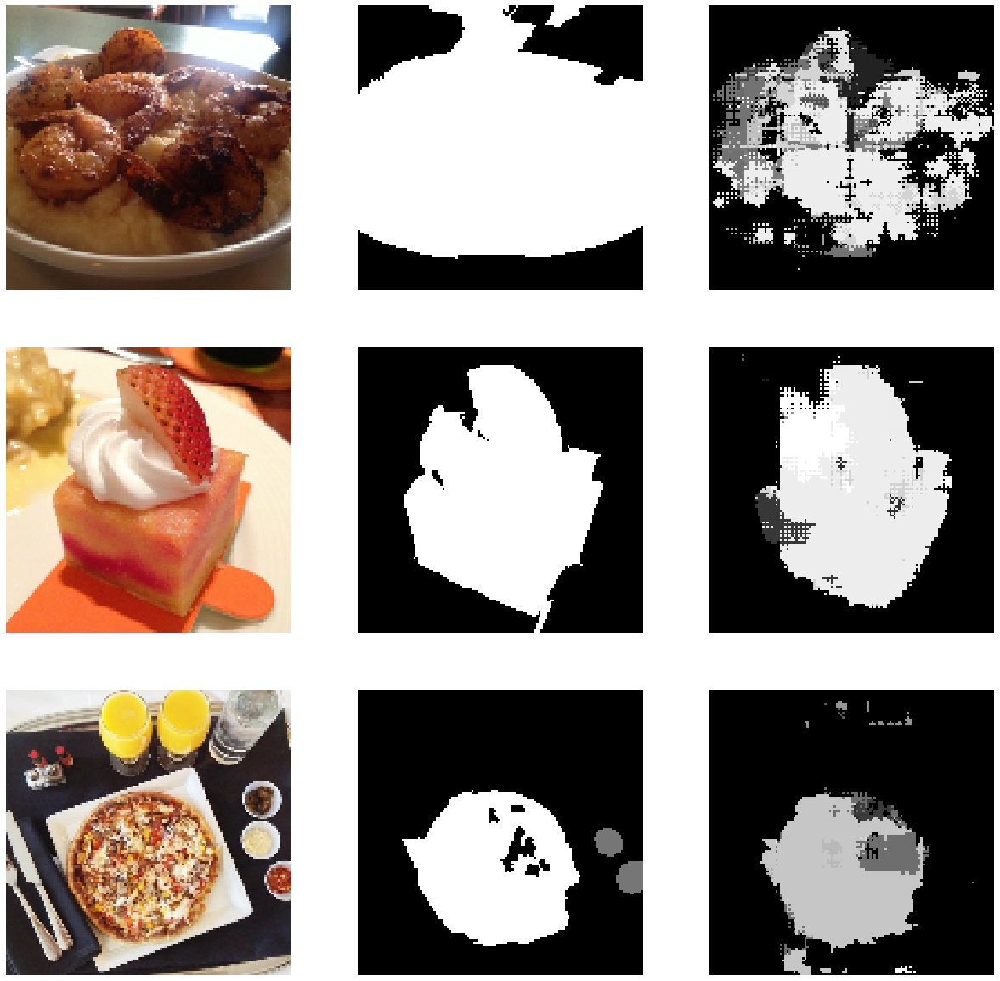


Epoch 00017: saving model to checkpoints/run_02\cp-0017.ckpt
Epoch 18/30
453/453 [==============================] - 975s 2s/step - loss: 0.9930 - accuracy: 0.6321 - val_loss: 0.9621 - val_accuracy: 0.6202
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


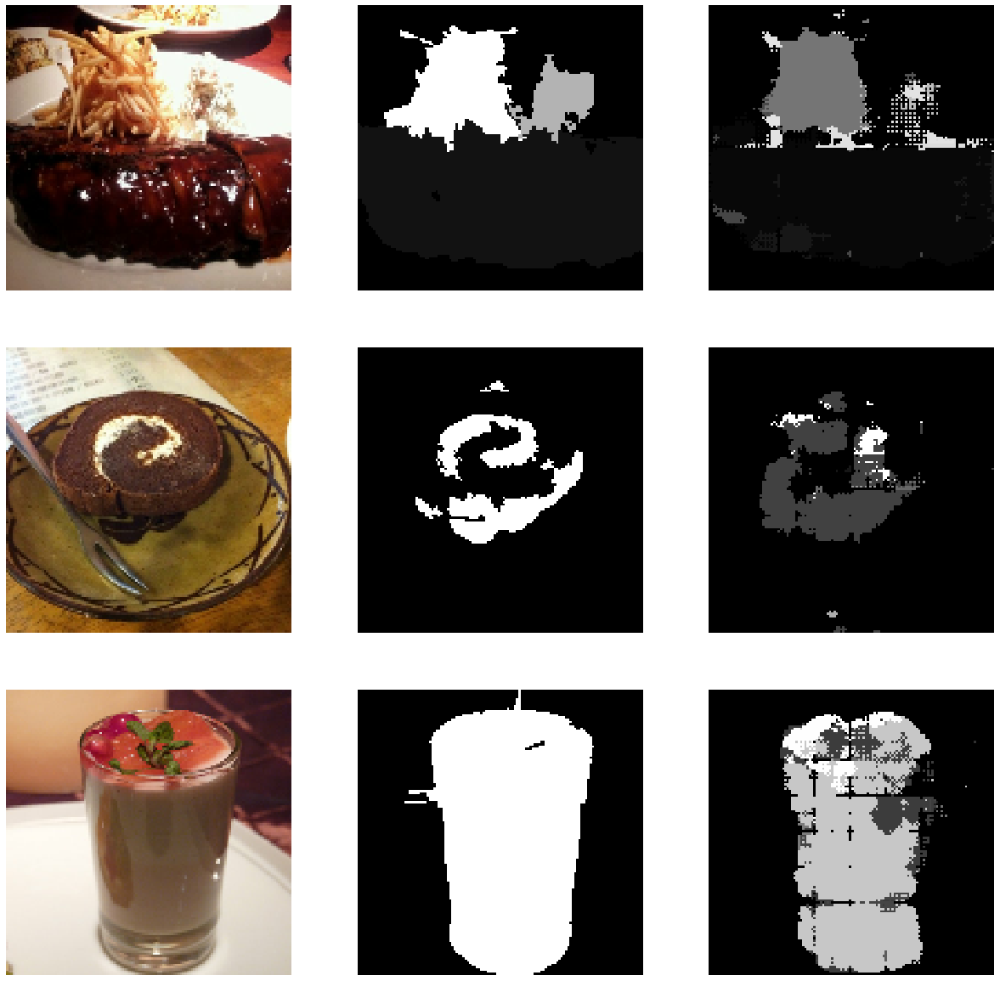


Epoch 00018: saving model to checkpoints/run_02\cp-0018.ckpt
Epoch 19/30
453/453 [==============================] - 996s 2s/step - loss: 0.9396 - accuracy: 0.6284 - val_loss: 0.9525 - val_accuracy: 0.6075
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


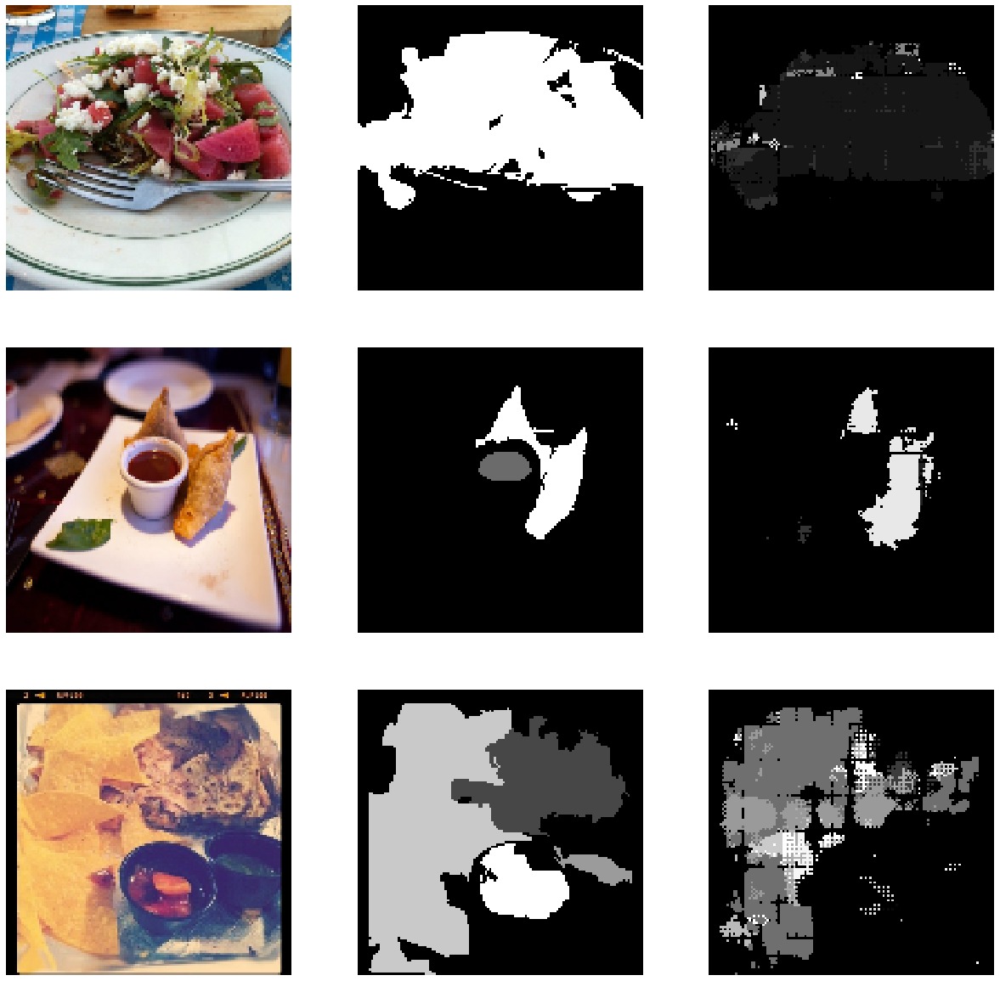


Epoch 00019: saving model to checkpoints/run_02\cp-0019.ckpt
Epoch 20/30
453/453 [==============================] - 990s 2s/step - loss: 0.8952 - accuracy: 0.6246 - val_loss: 0.9031 - val_accuracy: 0.6126
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


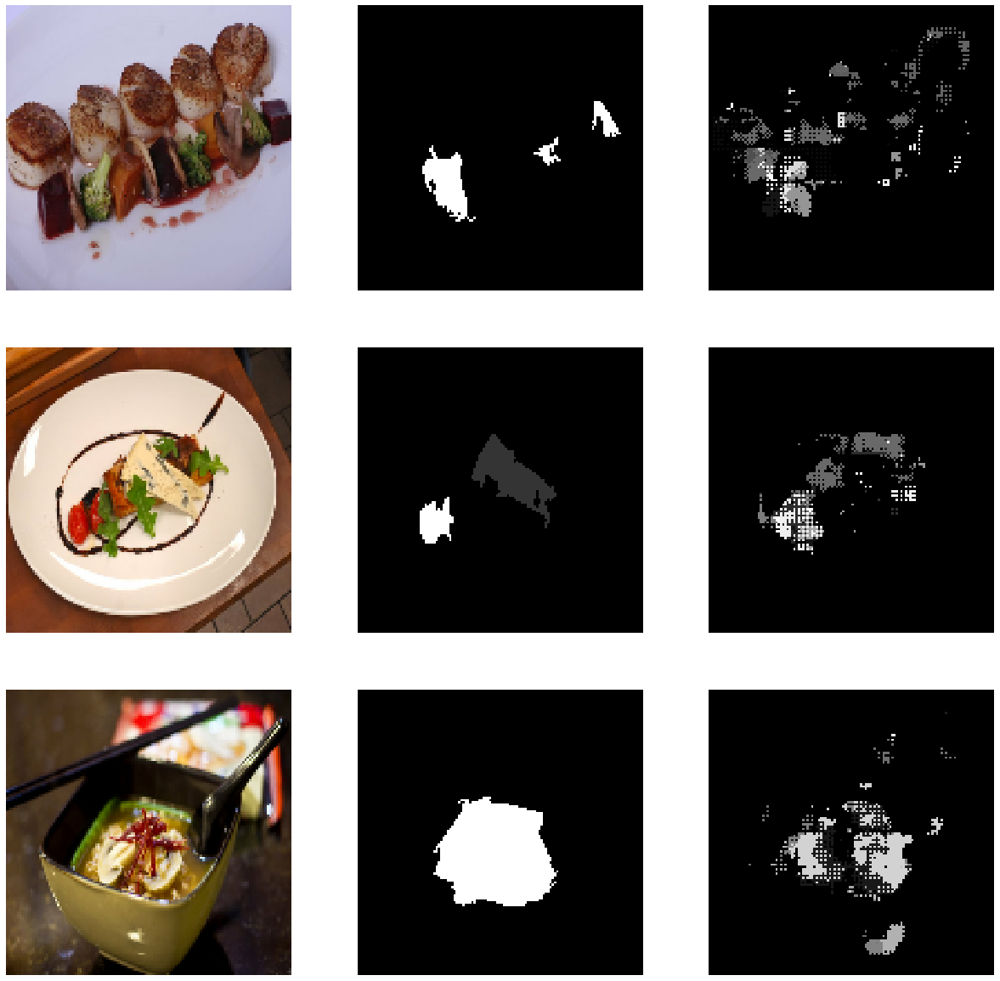


Epoch 00020: saving model to checkpoints/run_02\cp-0020.ckpt
Epoch 21/30
453/453 [==============================] - 975s 2s/step - loss: 0.8384 - accuracy: 0.6212 - val_loss: 0.8506 - val_accuracy: 0.6509
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


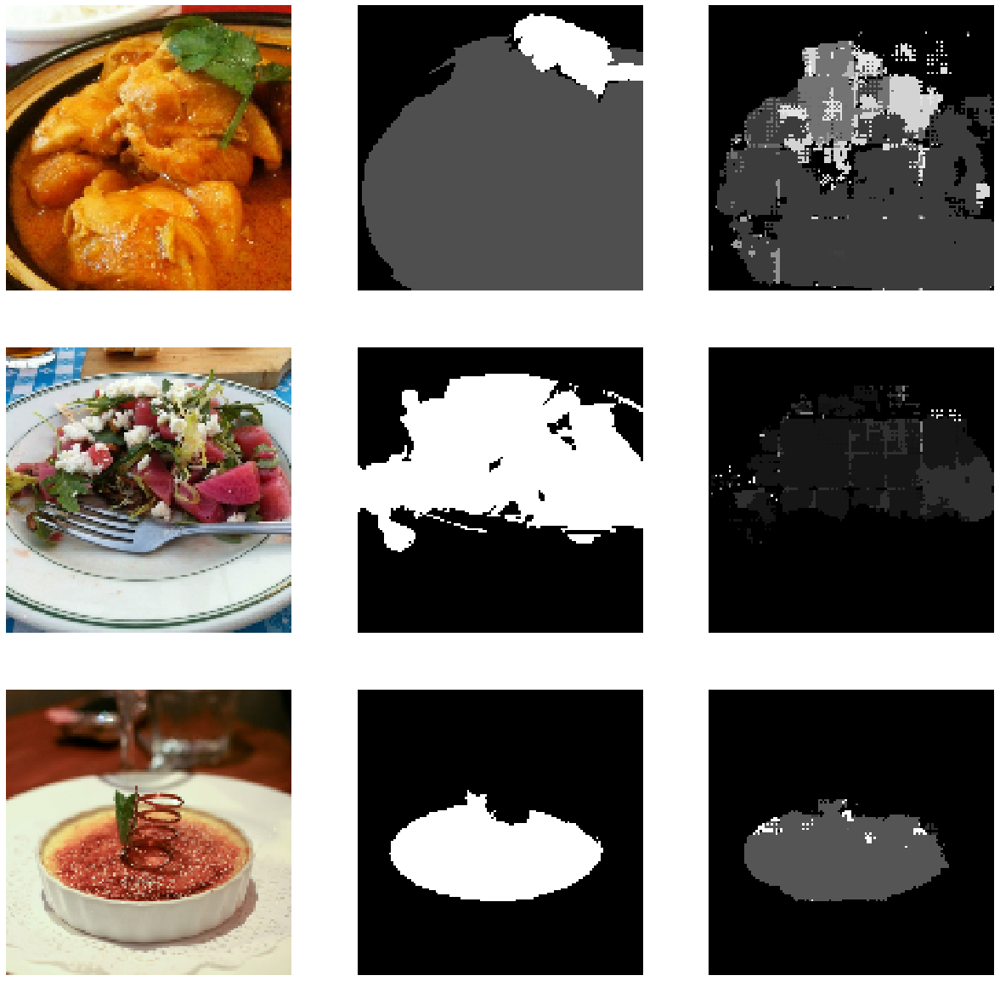


Epoch 00021: saving model to checkpoints/run_02\cp-0021.ckpt
Epoch 22/30
453/453 [==============================] - 978s 2s/step - loss: 0.7955 - accuracy: 0.6185 - val_loss: 0.8565 - val_accuracy: 0.6107
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


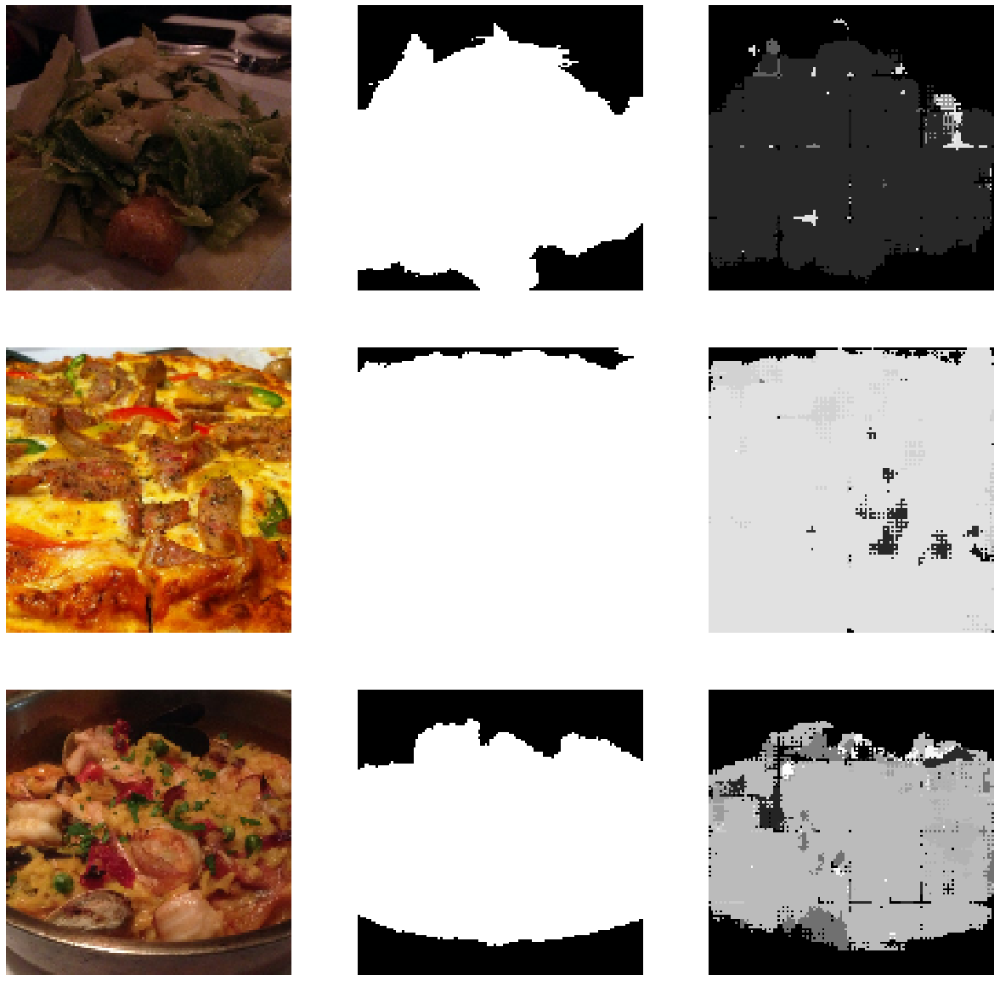


Epoch 00022: saving model to checkpoints/run_02\cp-0022.ckpt
Epoch 23/30
453/453 [==============================] - 994s 2s/step - loss: 0.7626 - accuracy: 0.6151 - val_loss: 0.8124 - val_accuracy: 0.6089
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


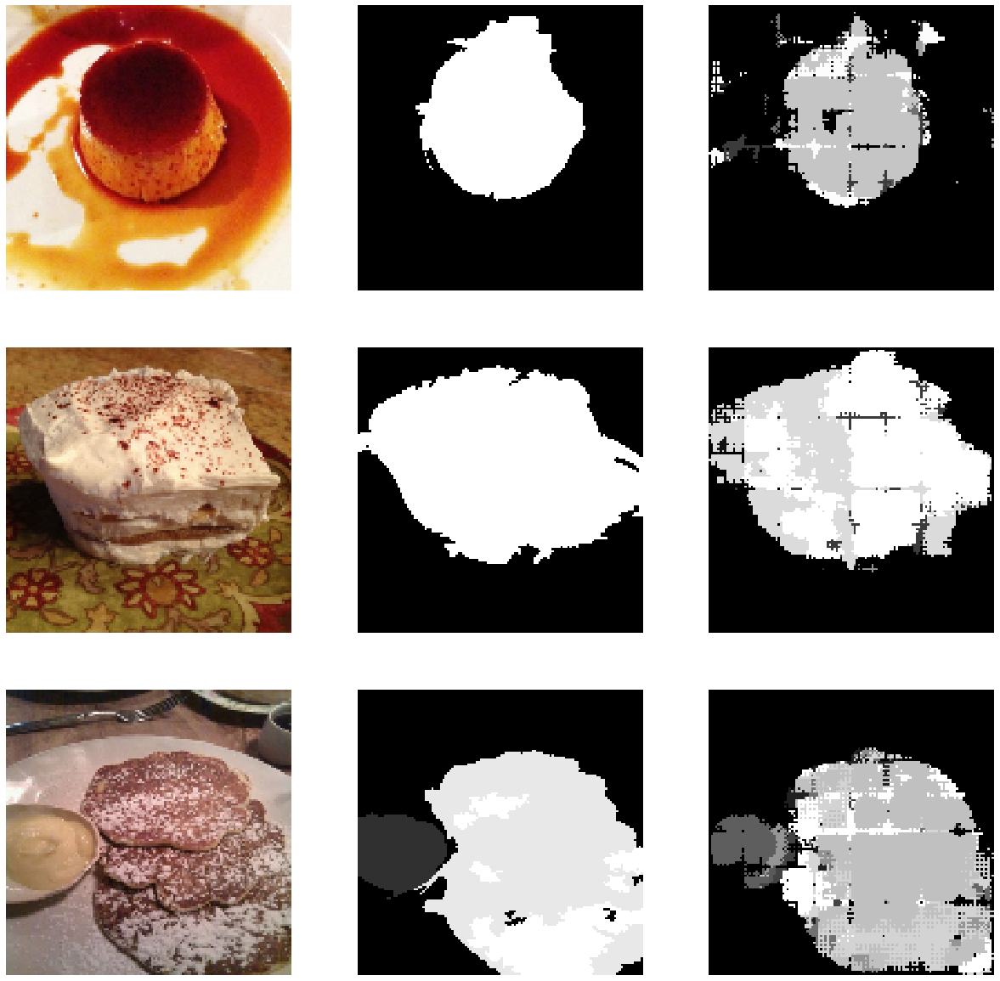


Epoch 00023: saving model to checkpoints/run_02\cp-0023.ckpt
Epoch 24/30
453/453 [==============================] - 1001s 2s/step - loss: 0.7297 - accuracy: 0.6129 - val_loss: 0.8005 - val_accuracy: 0.5839
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


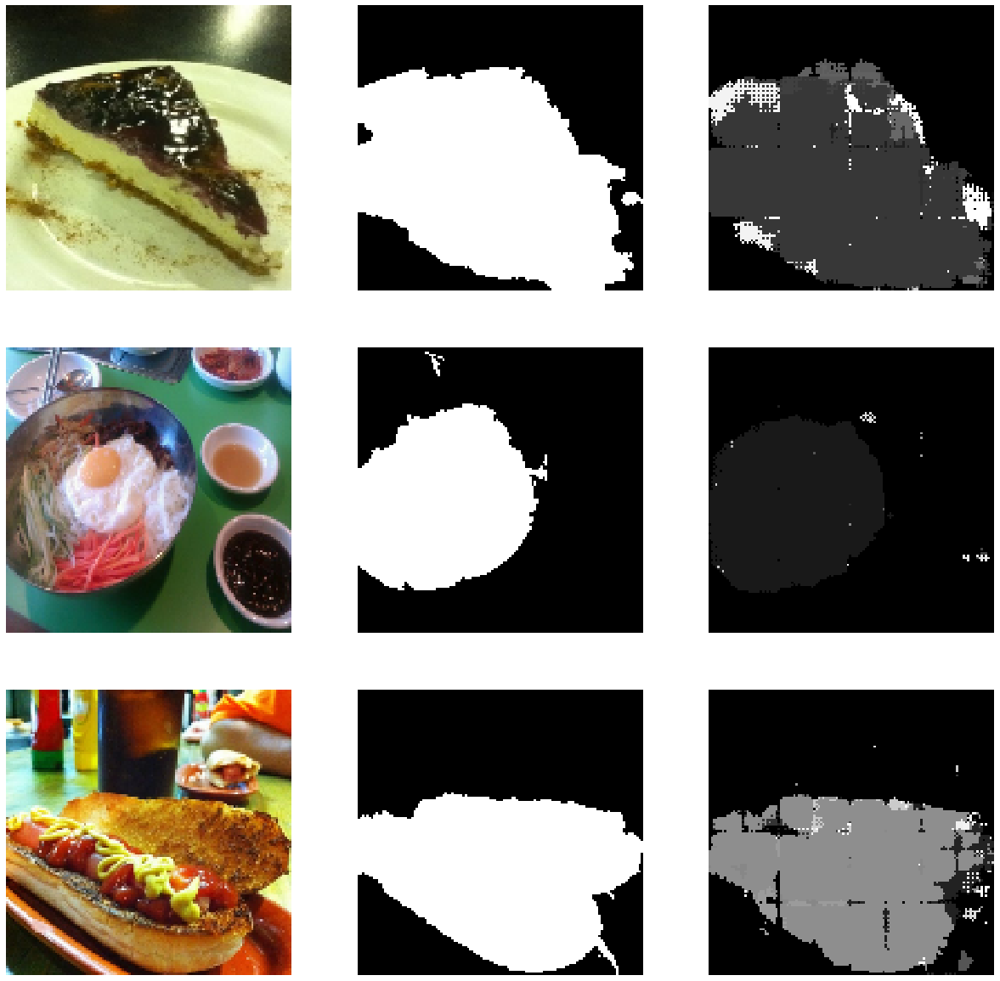


Epoch 00024: saving model to checkpoints/run_02\cp-0024.ckpt
Epoch 25/30
453/453 [==============================] - 985s 2s/step - loss: 0.6813 - accuracy: 0.6108 - val_loss: 0.7992 - val_accuracy: 0.6367
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


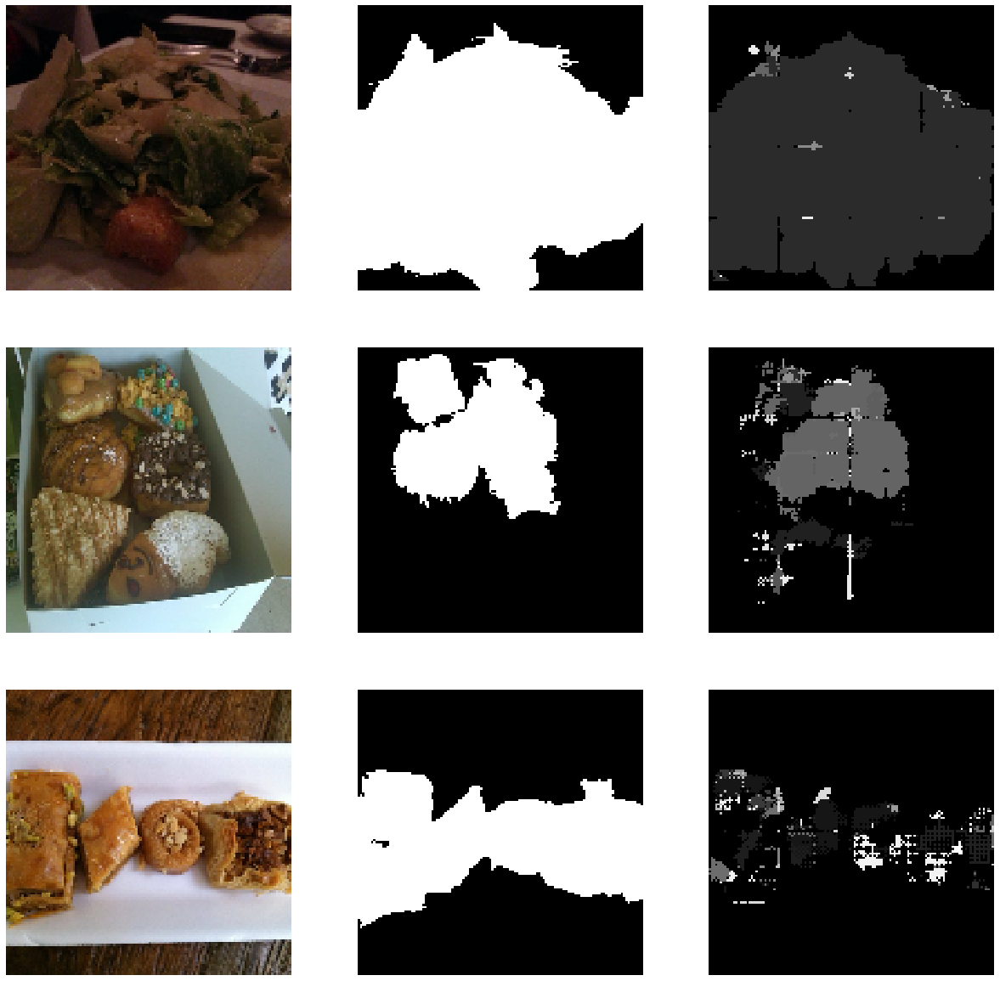


Epoch 00025: saving model to checkpoints/run_02\cp-0025.ckpt
Epoch 26/30
453/453 [==============================] - 995s 2s/step - loss: 0.6633 - accuracy: 0.6087 - val_loss: 0.7463 - val_accuracy: 0.5993
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


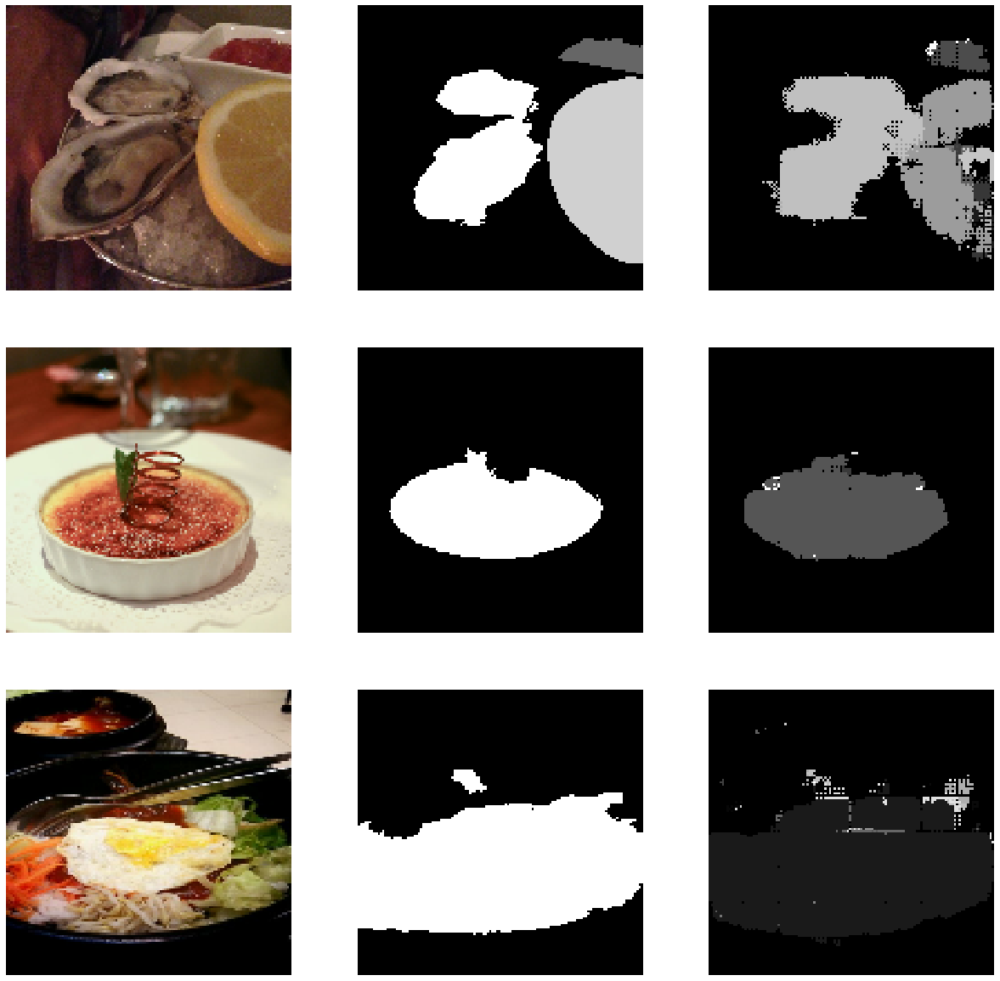


Epoch 00026: saving model to checkpoints/run_02\cp-0026.ckpt
Epoch 27/30
453/453 [==============================] - 1002s 2s/step - loss: 0.6310 - accuracy: 0.6064 - val_loss: 0.7646 - val_accuracy: 0.5871
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


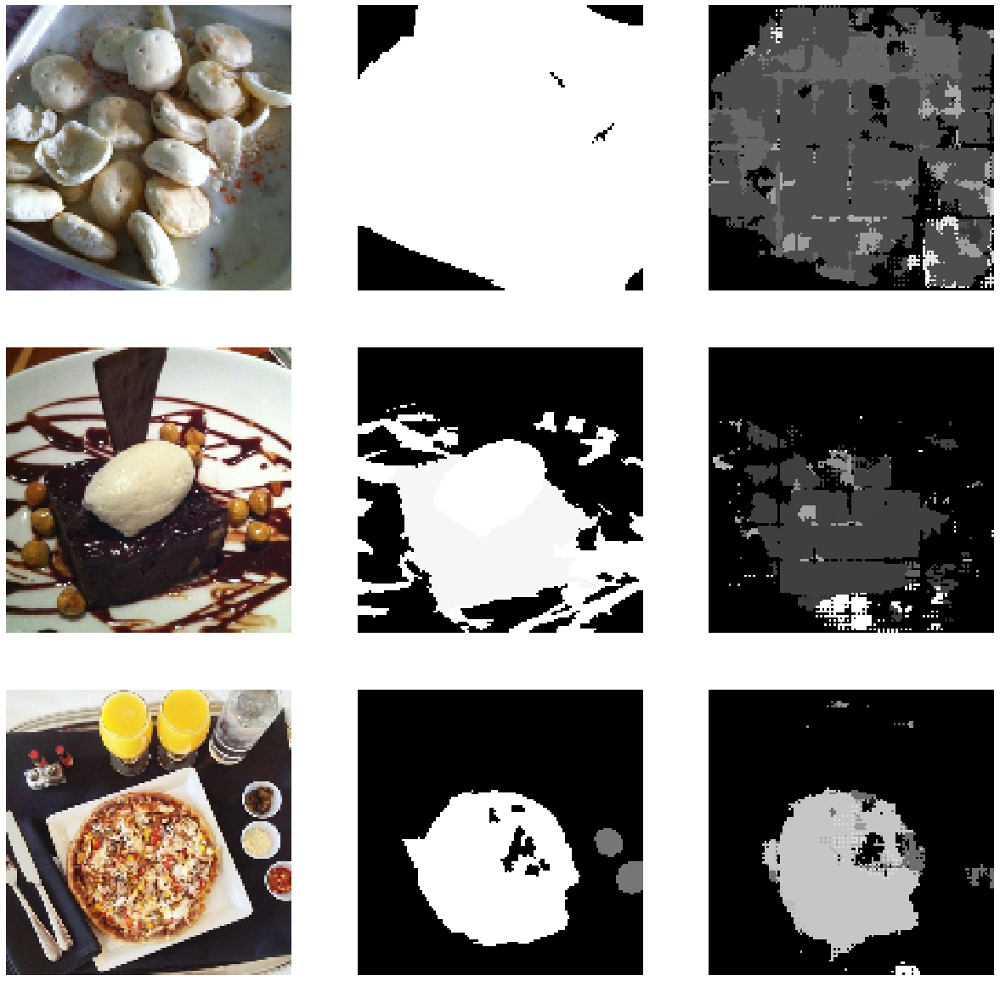


Epoch 00027: saving model to checkpoints/run_02\cp-0027.ckpt
Epoch 28/30
453/453 [==============================] - 1008s 2s/step - loss: 0.6065 - accuracy: 0.6050 - val_loss: 0.7039 - val_accuracy: 0.6037
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


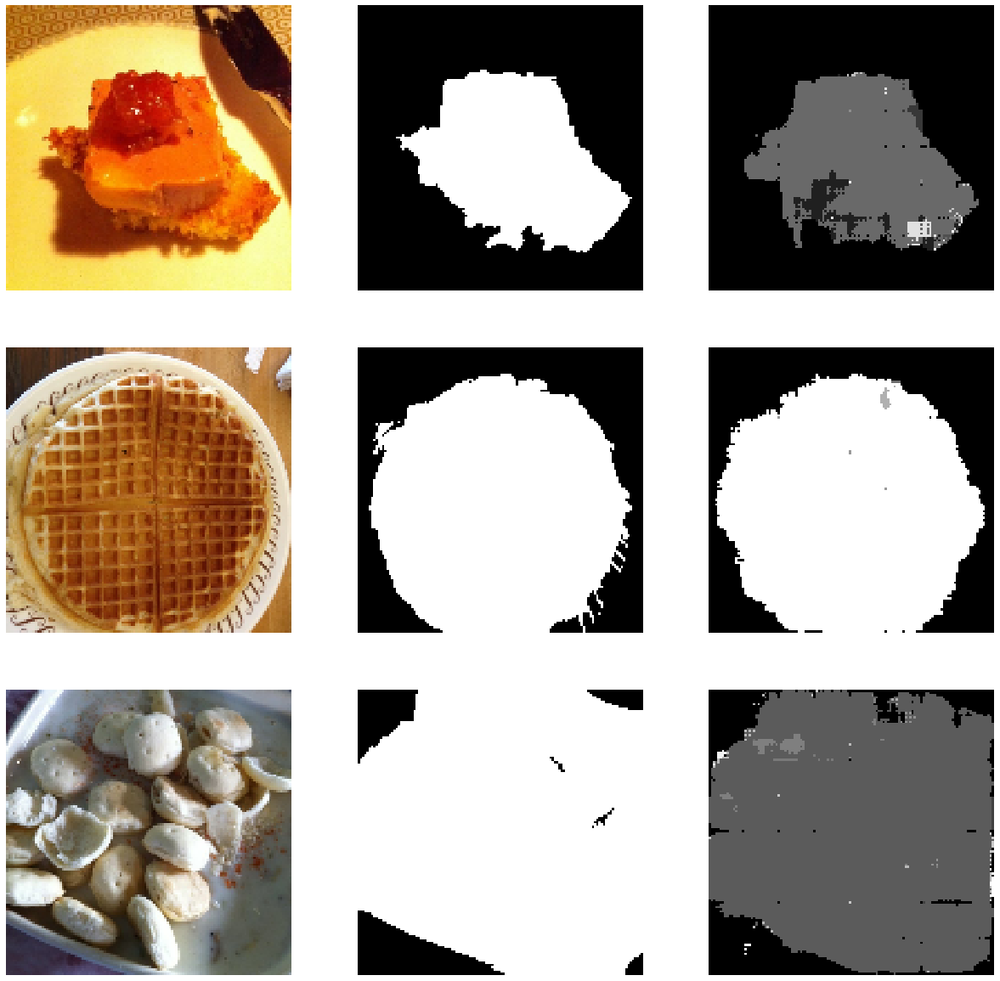


Epoch 00028: saving model to checkpoints/run_02\cp-0028.ckpt
Epoch 29/30
453/453 [==============================] - 1006s 2s/step - loss: 0.5759 - accuracy: 0.6034 - val_loss: 0.7182 - val_accuracy: 0.5924
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


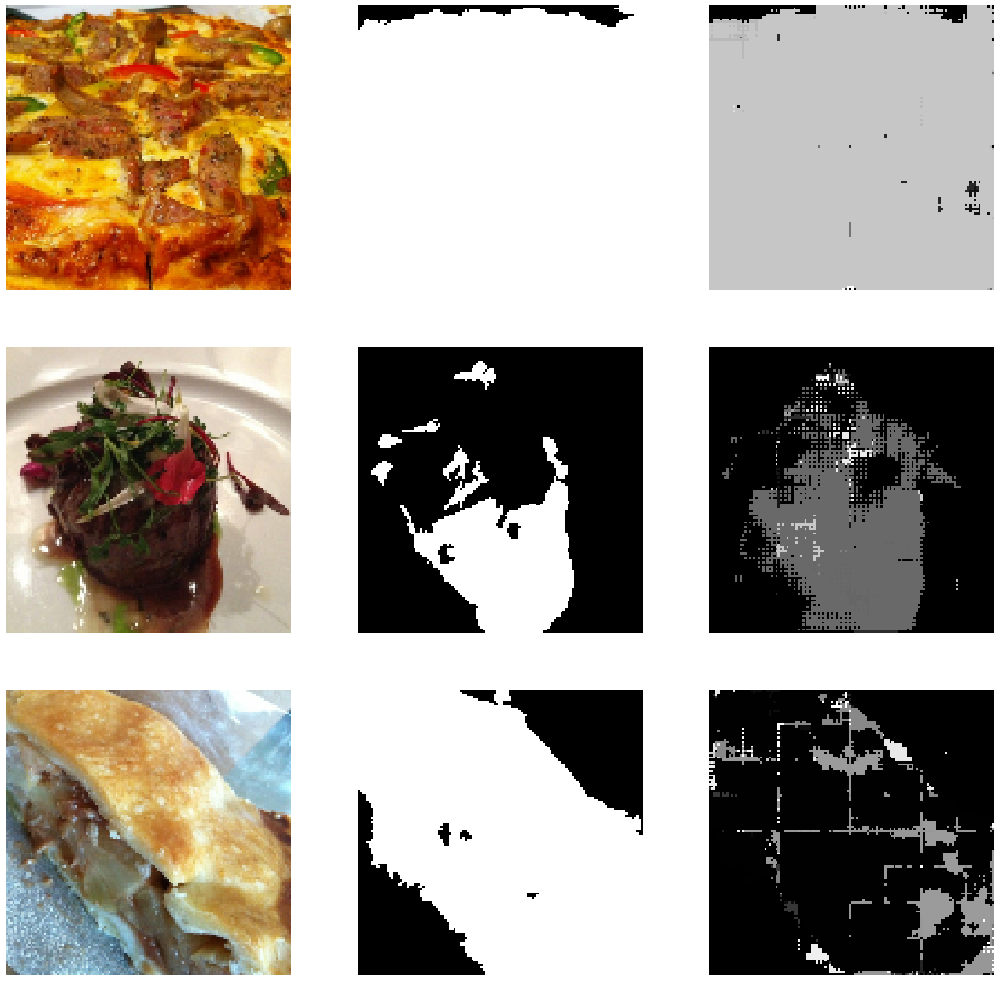


Epoch 00029: saving model to checkpoints/run_02\cp-0029.ckpt
Epoch 30/30
453/453 [==============================] - 1018s 2s/step - loss: 0.5591 - accuracy: 0.6016 - val_loss: 0.6732 - val_accuracy: 0.6135
(16, 128, 128, 1)
(16, 128, 128, 1)
(16, 128, 128, 1)


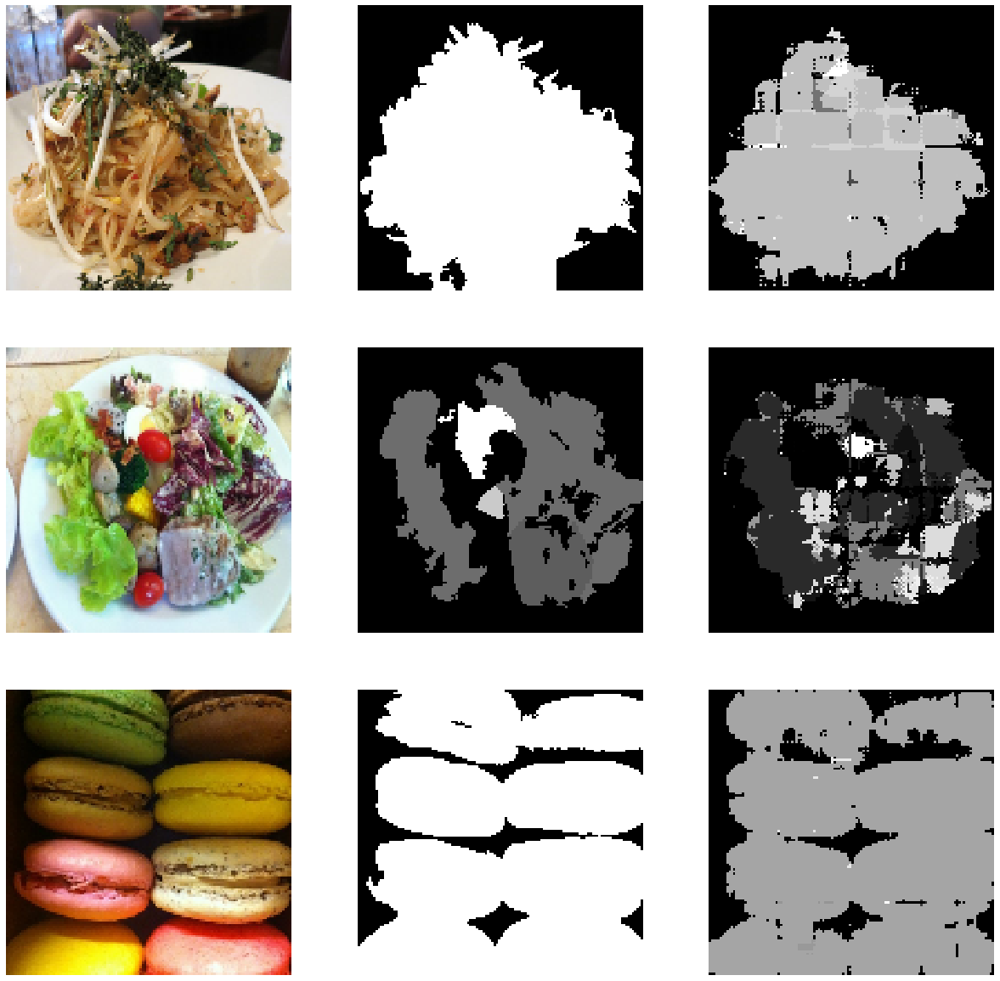


Epoch 00030: saving model to checkpoints/run_02\cp-0030.ckpt


In [89]:
model_history_fine = model.fit(train_data, epochs=EPOCHS+20, initial_epoch=model_history.epoch[-1], validation_data=val_data, callbacks=[MaskCallback(), cp_fine_callback])

In [115]:
loss = model_history.history['loss'].copy()
val_loss = model_history.history['val_loss'].copy()
loss += model_history_fine.history['loss'].copy()
val_loss += model_history_fine.history['val_loss'].copy()
epochs = range(EPOCHS + 21)

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 5])
plt.legend()
plt.show()

## Results

In [104]:
# Load weights from the select epoch.
model.load_weights("checkpoints/run_01/cp-0030.ckpt")

In [111]:
model.evaluate(val_data)

1820/1820 [==============================] - 258s 141ms/step - loss: 1.2886 - accuracy: 0.6110


[1.328113317489624, 0.615241527557373]

In [149]:
# TODO: For some reason it does not work within the Tensorflow graph (as part of metric),
# even though only `tf.` operations are used.
def calculate_iou(y_true, y_pred):
    """
    Returns IoU of all classes.
    """
    y_true = tf.reshape(y_true, [IMAGE_HEIGHT * IMAGE_WIDTH])
    classes_true, _ = tf.unique(y_true)

    y_pred = tf.math.argmax(y_pred, axis=-1)
    y_pred = tf.reshape(y_pred, [IMAGE_HEIGHT * IMAGE_WIDTH])
    classes_pred, _ = tf.unique(tf.cast(y_pred, tf.uint8))

    classes, _ = tf.unique(tf.concat([classes_true, classes_pred], axis=-1))
    iou_list = tf.TensorArray(tf.float32, size=0, dynamic_size=True)

    for i in classes:
        y_true_mask = tf.math.equal(y_true, i)
        y_pred_mask = tf.math.equal(tf.cast(y_pred, tf.uint8), i)

        intersection_mask = tf.math.logical_and(y_true_mask, y_pred_mask)
        union_mask = tf.math.logical_or(y_true_mask, y_pred_mask)

        intersection = tf.reduce_sum(tf.cast(intersection_mask, tf.float32))
        union = tf.reduce_sum(tf.cast(union_mask, tf.float32))

        #print(f"[{i}] {intersection} / {union}")
        iou = intersection / union
        iou_list = iou_list.write(iou_list.size(), iou)
    return iou_list.concat() #tf.reduce_mean(iou_list.concat())

In [150]:
test_iou_no_background = []
test_iou_top_5 = []
test_iou = []

for batch_image, batch_mask in val_data:
    batch_pred = model.predict(batch_image)
    for true_mask, pred_mask in zip(batch_mask, batch_pred):
        iou_list = calculate_iou(true_mask, pred_mask)
        try:
            iou = np.mean(iou_list)
            test_iou.append(iou)

            classes = len(iou_list)
            iou_no_background = np.mean(iou_list[1:])
            test_iou_no_background.append(iou_no_background)

            iou_top_5 = np.mean(iou_list[1:6])
            test_iou_top_5.append(iou_top_5)
        except:
            print('Only background in image.')


In [151]:
print(f"Test result without backround class: {np.mean(test_iou_no_background)}")
print(f"Test result of top 5 non background classes: {np.mean(test_iou_top_5)}")
print(f"Test result with backround class: {np.mean(test_iou)}")

Test result without backround class: 0.04569432511925697
Test result of top 5 non background classes: 0.13438859581947327
Test result with backround class: 0.08843890577554703


In [117]:
plot_mask_predictions(val_data, 50)

## Convert to `.tflite`

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model(DRIVE_FOLDER + '/models/full_02')
tflite_model = converter.convert()
open(DRIVE_FOLDER + "/tflite_models/full_01.tflite", "wb").write(tflite_model)